<a href="https://colab.research.google.com/github/linsoomin/HYU-ERICA-SCF-2022-2/blob/Daniel/STEM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import os 

import matplotlib.pyplot as plt
import seaborn as sns

from matplotlib import font_manager, rc
from matplotlib import rcParams

import warnings
warnings.filterwarnings('ignore')

In [ ]:
!sudo apt-get install -y fonts-nanum
!sudo fc-cache -fv
!rm ~/.cache/matplotlib -rf

Reading package lists... Done
Building dependency tree       
Reading state information... Done
fonts-nanum is already the newest version (20180306-3).
0 upgraded, 0 newly installed, 0 to remove and 24 not upgraded.
/usr/share/fonts: caching, new cache contents: 0 fonts, 1 dirs
/usr/share/fonts/truetype: caching, new cache contents: 0 fonts, 3 dirs
/usr/share/fonts/truetype/humor-sans: caching, new cache contents: 1 fonts, 0 dirs
/usr/share/fonts/truetype/liberation: caching, new cache contents: 16 fonts, 0 dirs
/usr/share/fonts/truetype/nanum: caching, new cache contents: 10 fonts, 0 dirs
/usr/local/share/fonts: caching, new cache contents: 0 fonts, 0 dirs
/root/.local/share/fonts: skipping, no such directory
/root/.fonts: skipping, no such directory
/usr/share/fonts/truetype: skipping, looped directory detected
/usr/share/fonts/truetype/humor-sans: skipping, looped directory detected
/usr/share/fonts/truetype/liberation: skipping, looped directory detected
/usr/share/fonts/truetype/n

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
os.chdir('/content/drive/MyDrive/Colab Notebooks/모두의 연구소/4월-학생회비/data')

In [ ]:
os.listdir()

['2022_2학기_중앙감사_과학기술대학 분자생명과학과 (1).xlsx',
 '2022년 화분공 결산안.xlsx',
 '2022_2학기_중앙감사_해양융합공학과.xlsx',
 '2022_2학기_중앙감사_과기대_응용물리학과.xlsx',
 '2022_2학기_중앙감사_과학기술융합대학.xlsx',
 '2022_2학기_중앙감사_나노광전자학과.xlsx']

In [ ]:
Spend = []
# student council fee : 학생회비
SCF = []
# 야식사업 지출
Snack_Money = []

# 과기대 학생회

In [ ]:
df_0 = pd.read_excel('2022_2학기_중앙감사_과학기술융합대학.xlsx', sheet_name='결산안')

In [ ]:
df_0.head()

,번호,날짜,내용,수입,지출,잔액,사업,세부항목,영수증
0,1,2022-06-22,과기대 싸테챔 상금-롤 1등,0,150000,-150000,과기대 싸테챔,과기대 싸테챔 상금(롤-1등),O
1,2,2022-06-22,이상희,0,100000,-250000,과기대 싸테챔,과기대 싸테챔 상금(롤-2등),O
2,3,2022-06-22,김현수,0,50000,-300000,과기대 싸테챔,과기대 싸테챔 상금(롤-3등),O
3,4,2022-06-22,정재웅,0,60000,-360000,과기대 싸테챔,과기대 싸테챔 상금(피파-1등),O
4,5,2022-06-22,박승민,0,40000,-400000,과기대 싸테챔,과기대 싸테챔 상금(피파-2등),O


In [ ]:
def to_month(month_num):
    month = ''
    if 1<= month_num < 2:
        month = '1월'
    elif 2<= month_num < 3:
        month = '2월'
    elif 3<= month_num < 4:
        month = '3월'
    elif 4<= month_num < 5:
        month = '4월'
    elif 5<= month_num < 6:
        month = '5월'
    elif 6<= month_num < 7:
        month = '6월'
    elif 7<= month_num < 8:
        month = '7월'
    elif 8<= month_num < 9:
        month = '8월'
    elif 9<= month_num < 10:
        month = '9월'
    elif 10<= month_num < 11:
        month = '10월'
    elif 11<= month_num < 12:
        month = '11월'
    else:
        month = '12월'
        
    return month

In [ ]:
df_0["날짜"] = pd.to_datetime(df_0["날짜"], format='%Y-%m-%d')
df_0["날짜"] = pd.Categorical(
    df_0['날짜'].dt.month.apply(to_month), 
    categories = ['1월', '2월', '3월', '4월', '5월', '6월', '7월', '8월', '9월', '10월', '11월', '12월']
)

In [ ]:
df_0.head()

,번호,날짜,내용,수입,지출,잔액,사업,세부항목,영수증
0,1,6월,과기대 싸테챔 상금-롤 1등,0,150000,-150000,과기대 싸테챔,과기대 싸테챔 상금(롤-1등),O
1,2,6월,이상희,0,100000,-250000,과기대 싸테챔,과기대 싸테챔 상금(롤-2등),O
2,3,6월,김현수,0,50000,-300000,과기대 싸테챔,과기대 싸테챔 상금(롤-3등),O
3,4,6월,정재웅,0,60000,-360000,과기대 싸테챔,과기대 싸테챔 상금(피파-1등),O
4,5,6월,박승민,0,40000,-400000,과기대 싸테챔,과기대 싸테챔 상금(피파-2등),O


In [ ]:
df_0.drop('번호', axis=1, inplace=True)

In [ ]:
# 사업의 종류
df_0['사업'].unique()

array(['과기대 싸테챔', '입출금통장 이자', '제휴 스템프 이벤트', '생일자 이벤트', '단과대학 감사위원 장학금',
       '쿠팡(와우 맵버십)', '총학생회비 추가납부분 입금', '기타', '돌아온 꿈꾸는 배움터', '학생회비 납부',
       '총학생회비 추가납부', '체육대회', '과동제', '분생 학생회비 지급', '학생회비 추가납부',
       '나노광전자학과 학생회비 추가 지급', '2023년도 선거', '크리스마스 키트 이벤트', '크리스마스',
       '크리스마스 포토존 이벤트'], dtype=object)

In [ ]:
# 총 수입
df_0['수입'].sum()

1797209

In [ ]:
# 총 지출
a = df_0['지출'].sum()
print(a)
Spend.append(a)

6155080


In [ ]:
# 잔액
# 과기대는 지출이 -4357871원 over 되었음을 알 수 있음

print(df_0['수입'].sum() - df_0['지출'].sum())

-4357871


## 사업별 지출, 수입 그래프

In [ ]:
sum_event = df_0.groupby('사업').sum()
sum_event = sum_event.reset_index()
sum_event

,사업,수입,지출,잔액
0,2023년도 선거,0,312050,-11959414
1,과기대 싸테챔,0,1750000,-37104703
2,과동제,0,205400,-4775956
3,기타,9980,0,-4097737
4,나노광전자학과 학생회비 추가 지급,0,100000,-2379984
5,단과대학 감사위원 장학금,0,120000,-13042218
6,돌아온 꿈꾸는 배움터,67300,203890,-27430079
7,분생 학생회비 지급,0,100000,-2409984
8,생일자 이벤트,0,426700,-8517727
9,입출금통장 이자,3919,0,-27667188


In [ ]:
Total_StudentIncome1 = df_0.loc[df_0['사업'].str.contains('학생회비', na = False), '수입'].sum()


SCF.append(Total_StudentIncome1)

In [ ]:
Snack1 = df_0.loc[df_0['사업'].str.contains('야식', na = False), '지출'].sum()

Snack_Money.append(Snack1)

### 사업별 수입 그래프

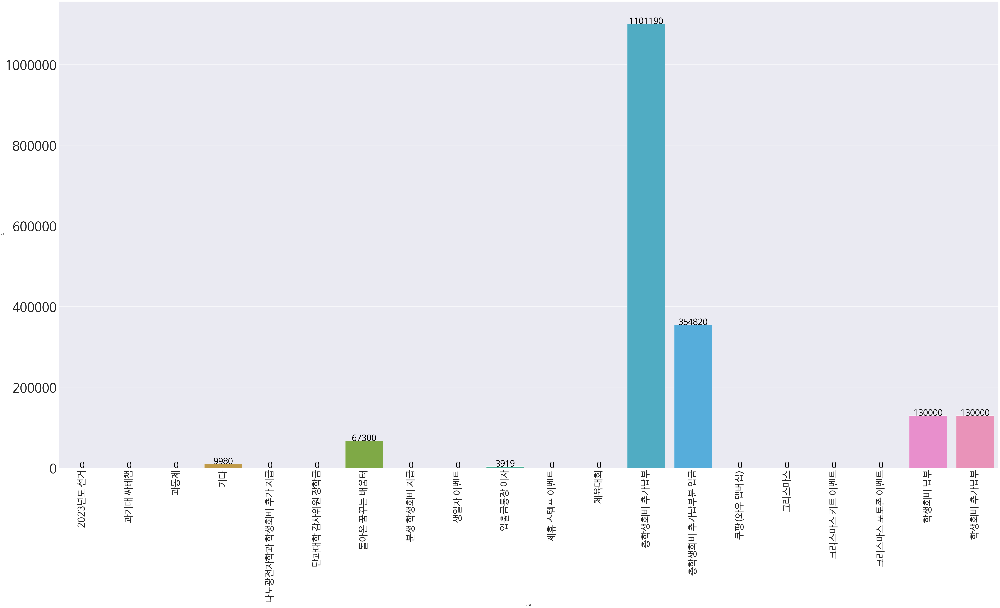

In [ ]:
g = sns.barplot(data=sum_event, x="사업",y="수입", ci=None)
ax = g

sns.set(font="NanumBarunGothic", 
        rc={"axes.unicode_minus":False},
        style='darkgrid')
plt.rc('xtick', labelsize=60)  # x축 눈금 폰트 크기 
plt.rc('ytick', labelsize=60)
plt.rc('font', family='NanumBarunGothic') 
plt.xticks(fontsize=45, rotation=90)

rcParams['figure.figsize'] = 80, 40
current_values = plt.gca().get_yticks()
plt.gca().set_yticklabels(['{:.0f}'.format(x) for x in current_values])

for p in ax.patches: 
    ax.annotate("%.0f" % p.get_height(), (p.get_x() + p.get_width()/2., p.get_height() - 30), 
       ha='center', va='center', fontsize=40, color='black', xytext=(0, 10), 
       textcoords='offset points') 

plt.show()

### 사업별 지출 그래프

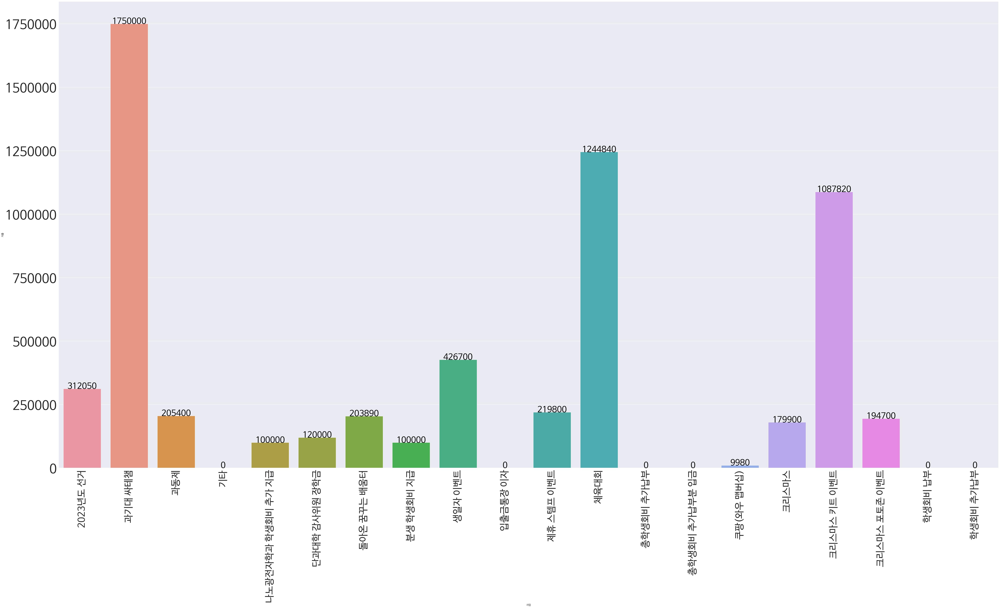

In [ ]:
g = sns.barplot(data=sum_event, x="사업",y="지출", ci=None)
ax = g

sns.set(font="NanumBarunGothic", 
        rc={"axes.unicode_minus":False},
        style='darkgrid')
plt.rc('xtick', labelsize=60)  # x축 눈금 폰트 크기 
plt.rc('ytick', labelsize=60)
plt.rc('font', family='NanumBarunGothic') 
plt.xticks(fontsize=45, rotation=90)

rcParams['figure.figsize'] = 80, 40
current_values = plt.gca().get_yticks()
plt.gca().set_yticklabels(['{:.0f}'.format(x) for x in current_values])

for p in ax.patches: 
    ax.annotate("%.0f" % p.get_height(), (p.get_x() + p.get_width()/2., p.get_height() - 30), 
       ha='center', va='center', fontsize=40, color='black', xytext=(0, 10), 
       textcoords='offset points') 

plt.show()

## 월별 토탈

In [ ]:
spend_money = df_0.groupby('날짜')['지출'].sum()
spend_money = spend_money.reset_index()
spend_money

,날짜,지출
0,1월,0
1,2월,0
2,3월,0
3,4월,0
4,5월,0
5,6월,2224000
6,7월,4990
7,8월,208880
8,9월,136500
9,10월,1400240


In [ ]:
income_money = df_0.groupby('날짜')['수입'].sum()
income_money = income_money.reset_index()
income_money

,날짜,수입
0,1월,0
1,2월,0
2,3월,0
3,4월,0
4,5월,0
5,6월,297
6,7월,245501
7,8월,77507
8,9월,1231627
9,10월,109694


### 월별 지출 그래프

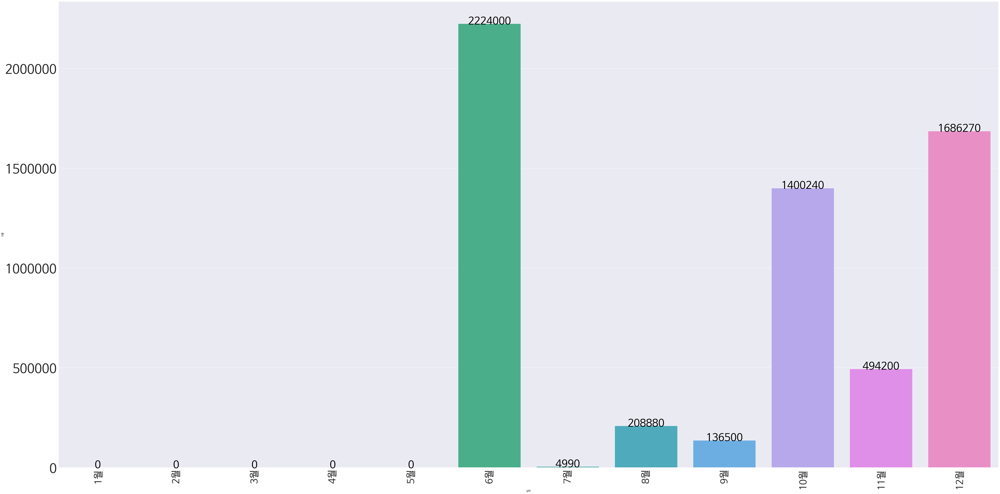

In [ ]:
g = sns.barplot(data= spend_money ,x= "날짜",y= "지출", ci=None)
ax = g

sns.set(font="NanumBarunGothic", 
        rc={"axes.unicode_minus":False},
        style='darkgrid')
plt.rc('xtick', labelsize=60)  # x축 눈금 폰트 크기 
plt.rc('ytick', labelsize=60)
plt.rc('font', family='NanumBarunGothic') 
plt.xticks(fontsize=45, rotation=90)

rcParams['figure.figsize'] = 80, 40
current_values = plt.gca().get_yticks()
plt.gca().set_yticklabels(['{:.0f}'.format(x) for x in current_values])

for p in ax.patches: 
    ax.annotate("%.0f" % p.get_height(), (p.get_x() + p.get_width()/2., p.get_height() - 30), 
       ha='center', va='center', fontsize=50, color='black', xytext=(0, 10), 
       textcoords='offset points') 

plt.show()

### 월별 수입 그래프

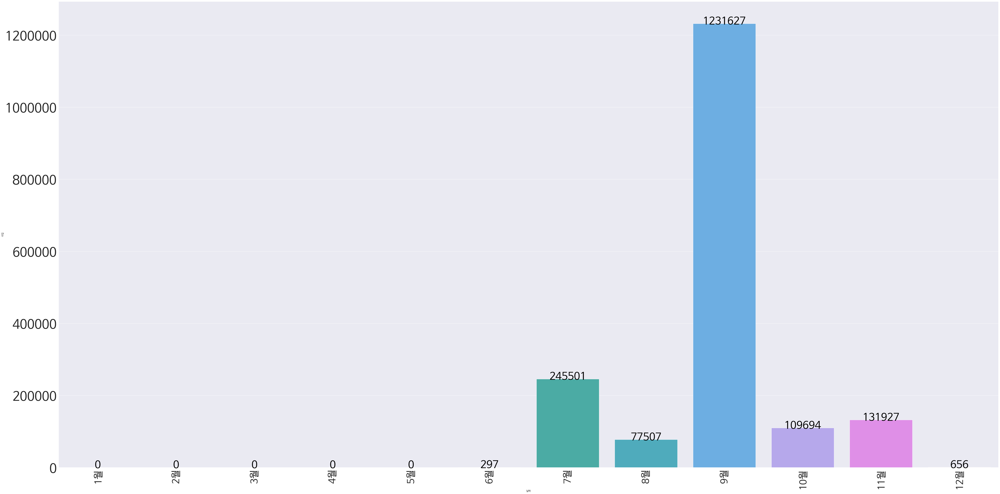

In [ ]:
g = sns.barplot(data=income_money ,x="날짜",y="수입", ci=None)
ax = g

sns.set(font="NanumBarunGothic", 
        rc={"axes.unicode_minus":False},
        style='darkgrid')
plt.rc('xtick', labelsize=60)  # x축 눈금 폰트 크기 
plt.rc('ytick', labelsize=60)
plt.rc('font', family='NanumBarunGothic') 
plt.xticks(fontsize=45, rotation=90)

rcParams['figure.figsize'] = 80, 40
current_values = plt.gca().get_yticks()
plt.gca().set_yticklabels(['{:.0f}'.format(x) for x in current_values])

for p in ax.patches: 
    ax.annotate("%.0f" % p.get_height(), (p.get_x() + p.get_width()/2., p.get_height() - 30), 
       ha='center', va='center', fontsize=50, color='black', xytext=(0, 10), 
       textcoords='offset points') 

plt.show()

## 인사이트 정리

1. 월 별로 가장 많이 쓴 달
  : 
### **6월에 2,224,000원 지출!**

2. 지출 금액이 가장 높았던 내용과 사업명
 :
### **과기대 싸테챔에 1,750,000원 지출!**

# 분자생명과학과

In [ ]:
df_1 = pd.read_excel('2022_2학기_중앙감사_과학기술대학 분자생명과학과 (1).xlsx', sheet_name='결산안')

In [ ]:
df_1.head()

,Unnamed: 0,날짜,내용,수입,지출,잔액,사업,세부항목,영수증
0,NaN,2021-12-31 00:00:00,서인혁,482482,0,482482,학생회비,21학년도 학생회비 이월금,x
1,NaN,2022-02-11 00:00:00,카카오페이,1,0,482483,카카오페이,학생회 공금통장 카카오페이 등록시 본인확인용 입금,x
2,NaN,2022-02-11 00:00:00,김태희,0,-247200,235283,졸업생 선물,졸업생 선물로 텀블러 구매,o
3,NaN,2022-02-11 00:00:00,권성원,247200,0,482483,입출금 및 결제 오류,송금오류,x
4,NaN,2022-02-11 00:00:00,권성원,0,-247200,235283,입출금 및 결제 오류,송금오류 복구내역,x


In [ ]:
df_1 = df_1.drop('Unnamed: 0',axis=1)

In [ ]:
def to_month(month_num):
    month = ''
    if 1<= month_num < 2:
        month = '1월'
    elif 2<= month_num < 3:
        month = '2월'
    elif 3<= month_num < 4:
        month = '3월'
    elif 4<= month_num < 5:
        month = '4월'
    elif 5<= month_num < 6:
        month = '5월'
    elif 6<= month_num < 7:
        month = '6월'
    elif 7<= month_num < 8:
        month = '7월'
    elif 8<= month_num < 9:
        month = '8월'
    elif 9<= month_num < 10:
        month = '9월'
    elif 10<= month_num < 11:
        month = '10월'
    elif 11<= month_num < 12:
        month = '11월'
    else:
        month = '12월'
        
    return month

In [ ]:
df_1['날짜'].replace('2022-09-28~2022-10-04','2022-09-28', inplace=True)

In [ ]:
df_1['날짜'].replace('2022-10-12~2022-11-01','2022-10-12', inplace=True)

In [ ]:
df_1['날짜'].replace('2022-12.10','2022-12-10', inplace=True)

In [ ]:
df_1["날짜"] = pd.to_datetime(df_1["날짜"], format='%Y-%m-%d')
df_1["날짜"] = pd.Categorical(
    df_1['날짜'].dt.month.apply(to_month), 
    categories = ['1월', '2월', '3월', '4월', '5월', '6월', '7월', '8월', '9월', '10월', '11월', '12월']
)

In [ ]:
df_1.head()

,날짜,내용,수입,지출,잔액,사업,세부항목,영수증
0,12월,서인혁,482482,0,482482,학생회비,21학년도 학생회비 이월금,x
1,2월,카카오페이,1,0,482483,카카오페이,학생회 공금통장 카카오페이 등록시 본인확인용 입금,x
2,2월,김태희,0,-247200,235283,졸업생 선물,졸업생 선물로 텀블러 구매,o
3,2월,권성원,247200,0,482483,입출금 및 결제 오류,송금오류,x
4,2월,권성원,0,-247200,235283,입출금 및 결제 오류,송금오류 복구내역,x


In [ ]:
# 사업의 종류
df_1['사업'].unique()

array(['학생회비', '카카오페이', '졸업생 선물', '입출금 및 결제 오류', '졸업생 선물 ', '할인혜택 ',
       '과방 복지', '실험복 수여식', '중간고사 야식사업', '스승의 날', '봄축제 주점준비', '봄축제 주점 준비',
       '봄축제 주점', '기말고사야식사업', '이자', '비요뜨 및 e-스포츠', '종강총회', '학생회비 감사',
       '학생회 LT', '꿈꾸는배움터', '개강총회', '체육대회 단체복', '복지물품 구매', '체육대회 상금',
       '학과 MT', '학생회비 추가입금', '학과 선거', '결산이자'], dtype=object)

In [ ]:
# 총 수입
df_1['수입'].sum()

9902925

In [ ]:
# 총 지출
b = df_1['지출'].sum()
print(b)
Spend.append(-b)

-9945700


In [ ]:
df_1.shape

(232, 8)

In [ ]:
# 잔액
# 분자생명과학과는 지출이 -42775원 over 되었음을 알 수 있음
print(df_1.iloc[231,4])

print(df_1['수입'].sum() + df_1['지출'].sum())

-42775
-42775


## 사업별 지출, 수입 그래프

In [ ]:
# 동일한 이름의 사업 합치기
df_1['사업'].replace('봄축제 주점준비','봄축제 주점 준비', inplace=True)

In [ ]:
sum_event = df_1.groupby('사업').sum()
sum_event = sum_event.reset_index()
sum_event

,사업,수입,지출,잔액
0,개강총회,25000,-147900,1497590
1,결산이자,868,0,43643
2,과방 복지,44500,-188600,6837049
3,기말고사야식사업,0,-112000,1477888
4,꿈꾸는배움터,0,-156650,3828430
5,복지물품 구매,0,-36540,1656010
6,봄축제 주점,1580280,0,1589888
7,봄축제 주점 준비,15090,-2382620,37013986
8,비요뜨 및 e-스포츠,0,-352500,7688410
9,스승의 날,0,-332150,6875714


In [ ]:
Total_StudentIncome2 = df_1.loc[df_1['사업'].str.contains('학생회비', na = False), '수입'].sum()


SCF.append(Total_StudentIncome2)

In [ ]:
Snack2 = df_1.loc[df_1['사업'].str.contains('야식', na = False), '지출'].sum()

Snack_Money.append(-Snack2)

### 사업별 수입 그래프

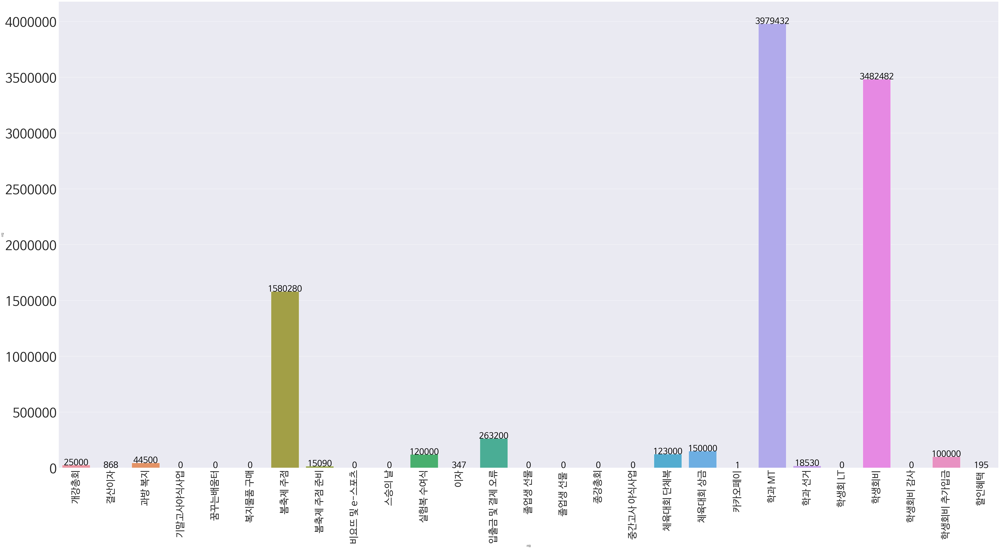

In [ ]:
g = sns.barplot(data=sum_event, x="사업",y="수입", ci=None)
ax = g

sns.set(font="NanumBarunGothic", 
        rc={"axes.unicode_minus":False},
        style='darkgrid')
plt.rc('xtick', labelsize=60)  # x축 눈금 폰트 크기 
plt.rc('ytick', labelsize=60)
plt.rc('font', family='NanumBarunGothic') 
plt.xticks(fontsize=45, rotation=90)

rcParams['figure.figsize'] = 80, 40
current_values = plt.gca().get_yticks()
plt.gca().set_yticklabels(['{:.0f}'.format(x) for x in current_values])

for p in ax.patches: 
    ax.annotate("%.0f" % p.get_height(), (p.get_x() + p.get_width()/2., p.get_height() - 30), 
       ha='center', va='center', fontsize=40, color='black', xytext=(0, 10), 
       textcoords='offset points') 

plt.show()

### 사업별 지출 그래프




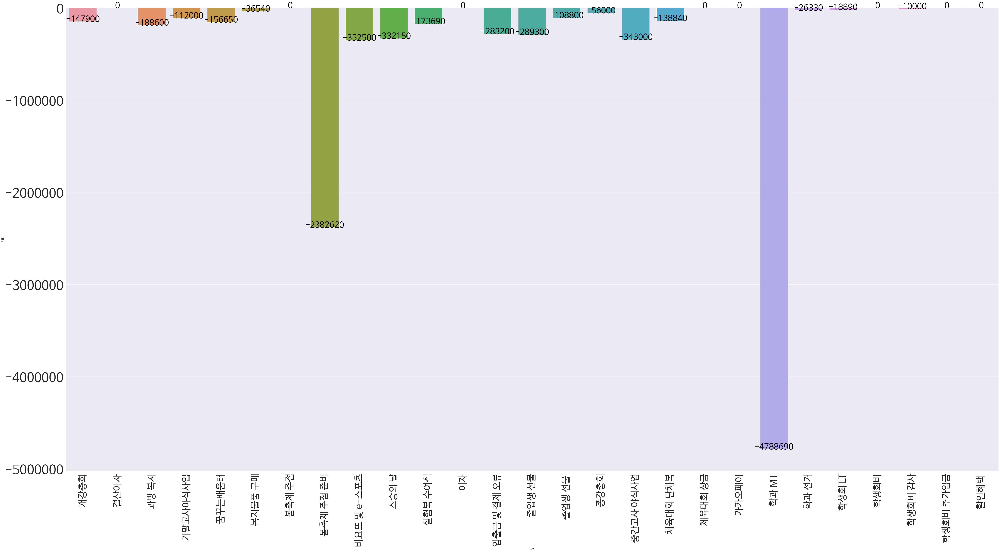

In [ ]:
g = sns.barplot(data=sum_event, x="사업",y="지출", ci=None)
ax = g

sns.set(font="NanumBarunGothic", 
        rc={"axes.unicode_minus":False},
        style='darkgrid')
plt.rc('xtick', labelsize=60)  # x축 눈금 폰트 크기 
plt.rc('ytick', labelsize=60)
plt.rc('font', family='NanumBarunGothic') 
plt.xticks(fontsize=45, rotation=90)

rcParams['figure.figsize'] = 80, 40
current_values = plt.gca().get_yticks()
plt.gca().set_yticklabels(['{:.0f}'.format(x) for x in current_values])

for p in ax.patches: 
    ax.annotate("%.0f" % p.get_height(), (p.get_x() + p.get_width()/2., p.get_height() - 30), 
       ha='center', va='center', fontsize=40, color='black', xytext=(0, 10), 
       textcoords='offset points') 

plt.show()

## 월별 토탈

In [ ]:
spend_money = df_1.groupby('날짜')['지출'].sum()
spend_money = spend_money.reset_index()
spend_money

,날짜,지출
0,1월,0
1,2월,-616300
2,3월,-132290
3,4월,-370000
4,5월,-2714770
5,6월,-552500
6,7월,-18890
7,8월,-76250
8,9월,-312840
9,10월,-2078840


In [ ]:
# 월 별로 가장 많이 쓴 달
## 5월에 2714770원 지출!
spend_money.iloc[spend_money['지출'].idxmin()]

날짜          5월
지출    -2714770
Name: 4, dtype: object

In [ ]:
# 주의 : 21학년도 학생회비 이월금(482482원)날짜가 2021-12-31라서 12월에 21년도 학생회비 이월금이 포함되어 있음!

income_money = df_1.groupby('날짜')['수입'].sum()
income_money = income_money.reset_index()
income_money

,날짜,수입
0,1월,0
1,2월,247216
2,3월,120180
3,4월,3000000
4,5월,15090
5,6월,1580627
6,7월,0
7,8월,0
8,9월,44000
9,10월,249000


### 월별 지출 그래프

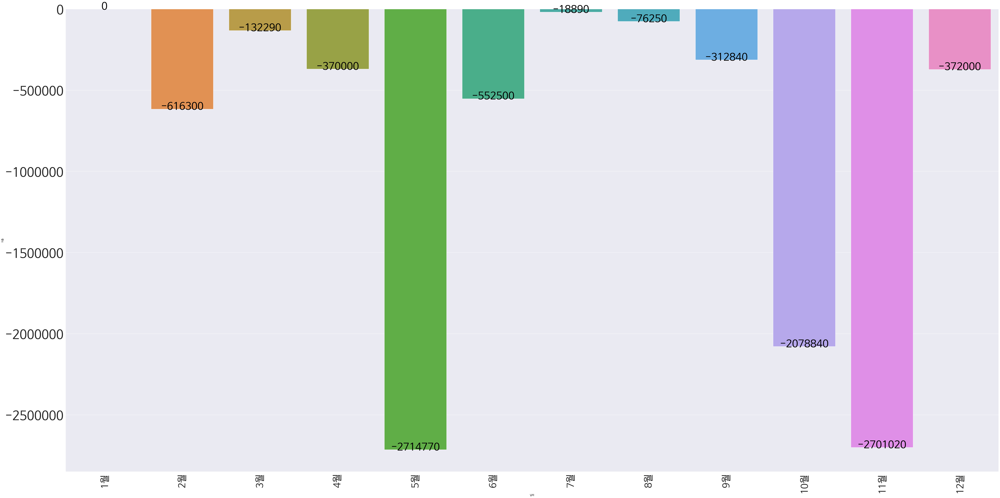

In [ ]:
g = sns.barplot(data= spend_money ,x= "날짜",y= "지출", ci=None)
ax = g

sns.set(font="NanumBarunGothic", 
        rc={"axes.unicode_minus":False},
        style='darkgrid')
plt.rc('xtick', labelsize=60)  # x축 눈금 폰트 크기 
plt.rc('ytick', labelsize=60)
plt.rc('font', family='NanumBarunGothic') 
plt.xticks(fontsize=45, rotation=90)

rcParams['figure.figsize'] = 80, 40
current_values = plt.gca().get_yticks()
plt.gca().set_yticklabels(['{:.0f}'.format(x) for x in current_values])

for p in ax.patches: 
    ax.annotate("%.0f" % p.get_height(), (p.get_x() + p.get_width()/2., p.get_height() - 30), 
       ha='center', va='center', fontsize=50, color='black', xytext=(0, 10), 
       textcoords='offset points') 

plt.show()

### 월별 수입 그래프

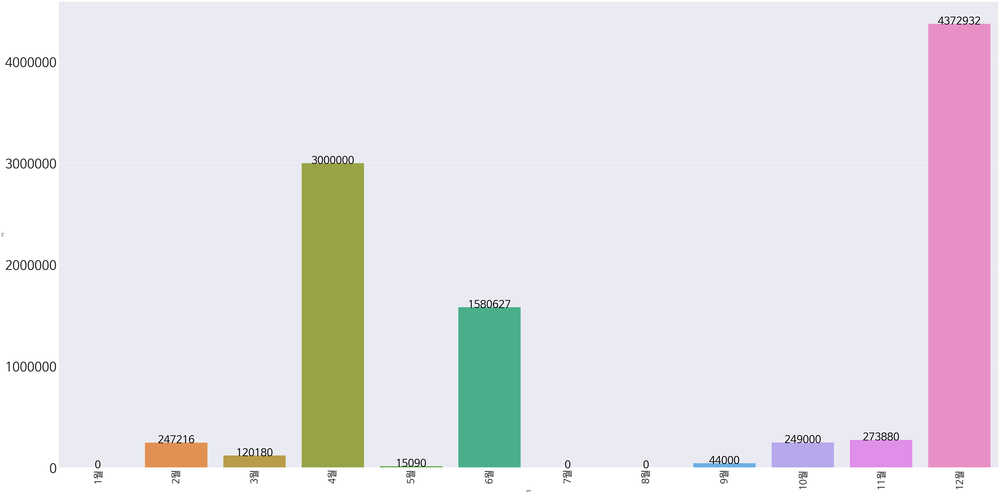

In [ ]:
g = sns.barplot(data=income_money ,x="날짜",y="수입", ci=None)
ax = g

sns.set(font="NanumBarunGothic", 
        rc={"axes.unicode_minus":False},
        style='darkgrid')
plt.rc('xtick', labelsize=60)  # x축 눈금 폰트 크기 
plt.rc('ytick', labelsize=60)
plt.rc('font', family='NanumBarunGothic') 
plt.xticks(fontsize=45, rotation=90)

rcParams['figure.figsize'] = 80, 40
current_values = plt.gca().get_yticks()
plt.gca().set_yticklabels(['{:.0f}'.format(x) for x in current_values])

for p in ax.patches: 
    ax.annotate("%.0f" % p.get_height(), (p.get_x() + p.get_width()/2., p.get_height() - 30), 
       ha='center', va='center', fontsize=50, color='black', xytext=(0, 10), 
       textcoords='offset points') 

plt.show()

## 인사이트 정리

1. 월 별로 가장 많이 쓴 달
  : 
### **5월에 2,714,770원 지출!**

2. 지출 금액이 가장 높았던 사업명과 금액
 :
### **학과 MT에 4,788,690원 지출!**


# 나노광전자학과



In [ ]:
df_2 = pd.read_excel('2022_2학기_중앙감사_나노광전자학과.xlsx', sheet_name='결산안')

In [ ]:
df_2.head()

,Unnamed: 0,날짜,내용,수입,지출,잔액,사업,세부항목,영수증
0,NaN,2022-01-01,기존 학생회비,1121167,0,1121167,학생회비,기존 1학기 학생회비,x
1,NaN,2022-06-25,입출금통장 이자,76,0,1121243,이자,입출금통장 이자 입금,x
2,NaN,2022-06-25,김지원,0,10000,1111243,감사위원 장학금,1학기 정기 감사 위원 장학금 지급,1
3,NaN,2022-07-23,입출금통장 이자,75,0,1111318,이자,입출금통장 이자 입금,x
4,NaN,2022-08-27,입출금통장 이자,96,0,1111414,이자,입출금통장 이자 입금,x


In [ ]:
df_2 = df_2.drop('Unnamed: 0',axis=1)

In [ ]:
def to_month(month_num):
    month = ''
    if 1<= month_num < 2:
        month = '1월'
    elif 2<= month_num < 3:
        month = '2월'
    elif 3<= month_num < 4:
        month = '3월'
    elif 4<= month_num < 5:
        month = '4월'
    elif 5<= month_num < 6:
        month = '5월'
    elif 6<= month_num < 7:
        month = '6월'
    elif 7<= month_num < 8:
        month = '7월'
    elif 8<= month_num < 9:
        month = '8월'
    elif 9<= month_num < 10:
        month = '9월'
    elif 10<= month_num < 11:
        month = '10월'
    elif 11<= month_num < 12:
        month = '11월'
    else:
        month = '12월'
        
    return month


In [ ]:
df_2["날짜"] = pd.to_datetime(df_2["날짜"], format='%Y-%m-%d')
df_2["날짜"] = pd.Categorical(
    df_2['날짜'].dt.month.apply(to_month), 
    categories = ['1월', '2월', '3월', '4월', '5월', '6월', '7월', '8월', '9월', '10월', '11월', '12월']
)


In [ ]:
# 사업의 종류
print(df_2['사업'].unique())


# 총 수입
print(df_2['수입'].sum())


# 총 지출
print(df_2['지출'].sum())

c = df_2['지출'].sum()
Spend.append(c)

['학생회비' '이자' '감사위원 장학금' '졸업생 선물' '2학기 체육대회' '캐시백' '과 돕바 공동 구매' '야식사업'
 '과 엠티' '과기대 지원금' 'E-sports 행사' '선거 비용' '꿈터 준비 비용']
2394667
2236030


In [ ]:
# 잔액
# 나노광전자학과는 잔액이 158637원 남았음.

print(df_2['수입'].sum() - df_2['지출'].sum())

158637


## 사업별 지출, 수입 그래프


In [ ]:
sum_event = df_2.groupby('사업').sum()
sum_event = sum_event.reset_index()
sum_event


,사업,수입,지출,잔액
0,2학기 체육대회,70000,210000,13342335
1,E-sports 행사,33000,200000,23854228
2,감사위원 장학금,0,10000,1111243
3,과 돕바 공동 구매,1020000,1020000,25644494
4,과 엠티,49500,237950,6435872
5,과기대 지원금,100000,0,686225
6,꿈터 준비 비용,0,48080,652876
7,선거 비용,0,18700,2116912
8,야식사업,0,444300,1681159
9,이자,489,0,5901782


In [ ]:
Total_StudentIncome3 = df_2.loc[df_2['사업'].str.contains('학생회비', na = False), '수입'].sum()

SCF.append(Total_StudentIncome3)

In [ ]:
Snack3 = df_2.loc[df_2['사업'].str.contains('야식', na = False), '지출'].sum()

Snack_Money.append(Snack3)

### 사업별 수입 그래프


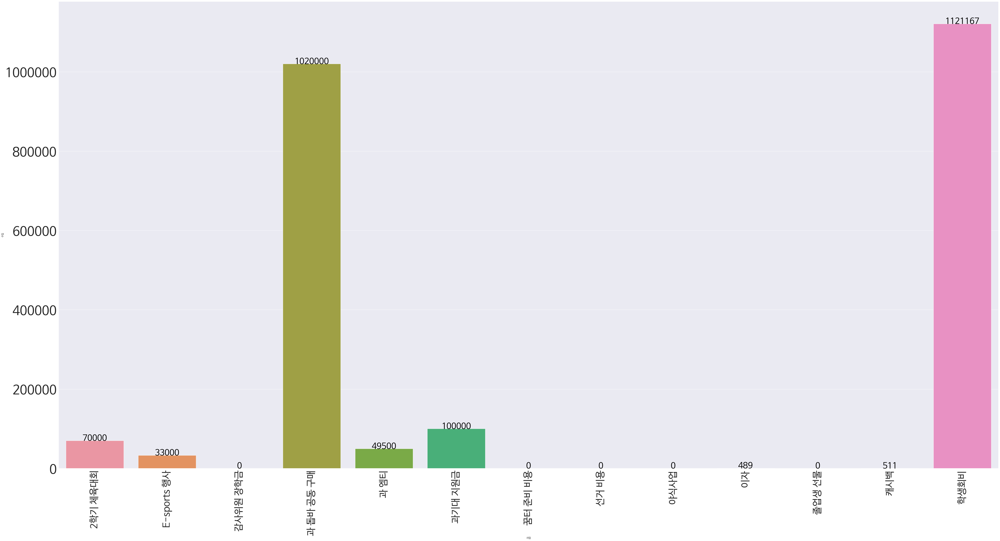

In [ ]:
g = sns.barplot(data=sum_event, x="사업",y="수입", ci=None)
ax = g

sns.set(font="NanumBarunGothic", 
        rc={"axes.unicode_minus":False},
        style='darkgrid')
plt.rc('xtick', labelsize=60)  # x축 눈금 폰트 크기 
plt.rc('ytick', labelsize=60)
plt.rc('font', family='NanumBarunGothic') 
plt.xticks(fontsize=45, rotation=90)

rcParams['figure.figsize'] = 80, 40
current_values = plt.gca().get_yticks()
plt.gca().set_yticklabels(['{:.0f}'.format(x) for x in current_values])

for p in ax.patches: 
    ax.annotate("%.0f" % p.get_height(), (p.get_x() + p.get_width()/2., p.get_height() - 30), 
       ha='center', va='center', fontsize=40, color='black', xytext=(0, 10), 
       textcoords='offset points') 

plt.show()


### 사업별 지출 그래프

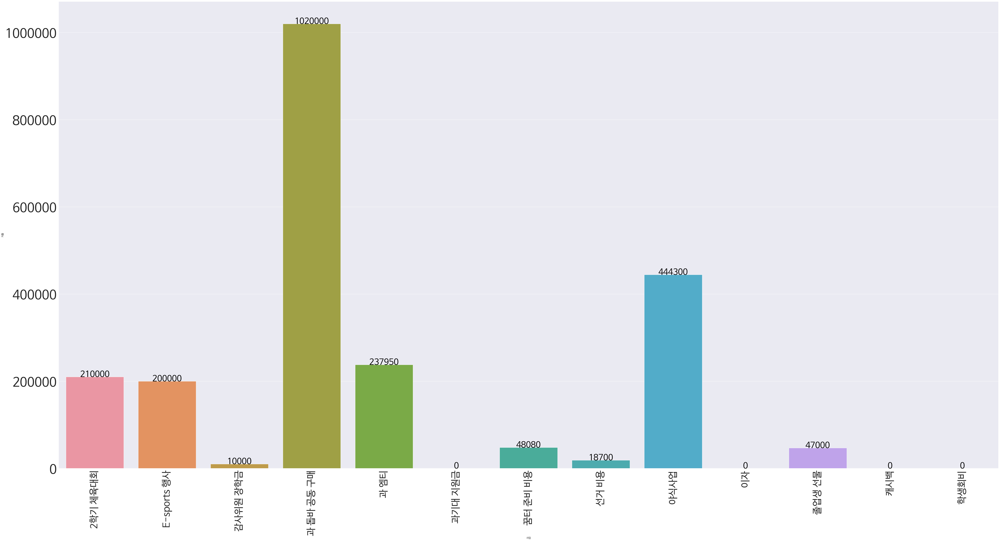

In [ ]:
g = sns.barplot(data=sum_event, x="사업",y="지출", ci=None)
ax = g

sns.set(font="NanumBarunGothic", 
        rc={"axes.unicode_minus":False},
        style='darkgrid')
plt.rc('xtick', labelsize=60)  # x축 눈금 폰트 크기 
plt.rc('ytick', labelsize=60)
plt.rc('font', family='NanumBarunGothic') 
plt.xticks(fontsize=45, rotation=90)

rcParams['figure.figsize'] = 80, 40
current_values = plt.gca().get_yticks()
plt.gca().set_yticklabels(['{:.0f}'.format(x) for x in current_values])

for p in ax.patches: 
    ax.annotate("%.0f" % p.get_height(), (p.get_x() + p.get_width()/2., p.get_height() - 30), 
       ha='center', va='center', fontsize=40, color='black', xytext=(0, 10), 
       textcoords='offset points') 

plt.show()

## 월별 토탈

In [ ]:
spend_money = df_2.groupby('날짜')['지출'].sum()
spend_money = spend_money.reset_index()
spend_money


,날짜,지출
0,1월,0
1,2월,0
2,3월,0
3,4월,0
4,5월,0
5,6월,10000
6,7월,0
7,8월,0
8,9월,47000
9,10월,1617950


In [ ]:
# 월 별로 가장 많이 쓴 달
## 10월에 1617950원 지출!
spend_money.iloc[spend_money['지출'].idxmax()]


날짜        10월
지출    1617950
Name: 9, dtype: object

In [ ]:
income_money = df_2.groupby('날짜')['수입'].sum()
income_money = income_money.reset_index()
income_money

,날짜,수입
0,1월,1121167
1,2월,0
2,3월,0
3,4월,0
4,5월,0
5,6월,76
6,7월,75
7,8월,96
8,9월,75
9,10월,1139686


### 월별 지출 그래프

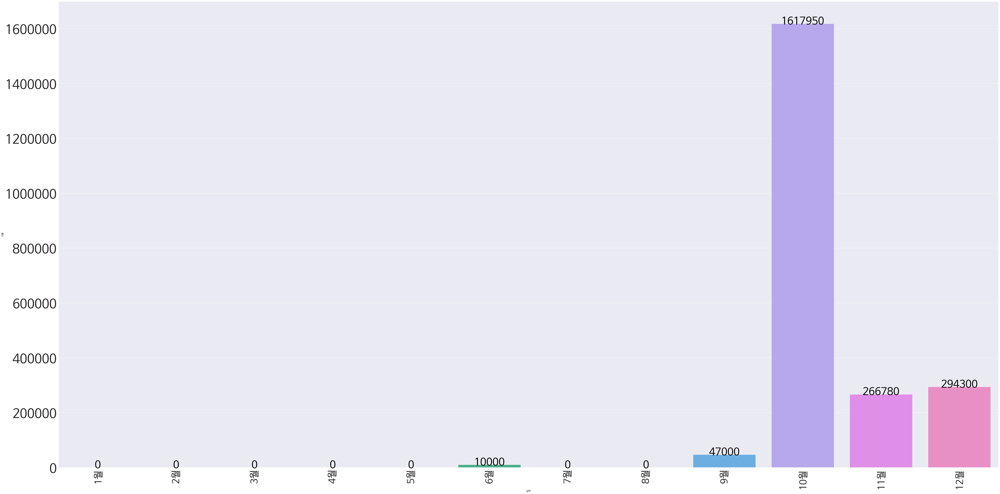

In [ ]:
g = sns.barplot(data= spend_money ,x= "날짜",y= "지출", ci=None)
ax = g

sns.set(font="NanumBarunGothic", 
        rc={"axes.unicode_minus":False},
        style='darkgrid')
plt.rc('xtick', labelsize=60)  # x축 눈금 폰트 크기 
plt.rc('ytick', labelsize=60)
plt.rc('font', family='NanumBarunGothic') 
plt.xticks(fontsize=45, rotation=90)

rcParams['figure.figsize'] = 80, 40
current_values = plt.gca().get_yticks()
plt.gca().set_yticklabels(['{:.0f}'.format(x) for x in current_values])

for p in ax.patches: 
    ax.annotate("%.0f" % p.get_height(), (p.get_x() + p.get_width()/2., p.get_height() - 30), 
       ha='center', va='center', fontsize=50, color='black', xytext=(0, 10), 
       textcoords='offset points') 

plt.show()


### 월별 수입 그래프


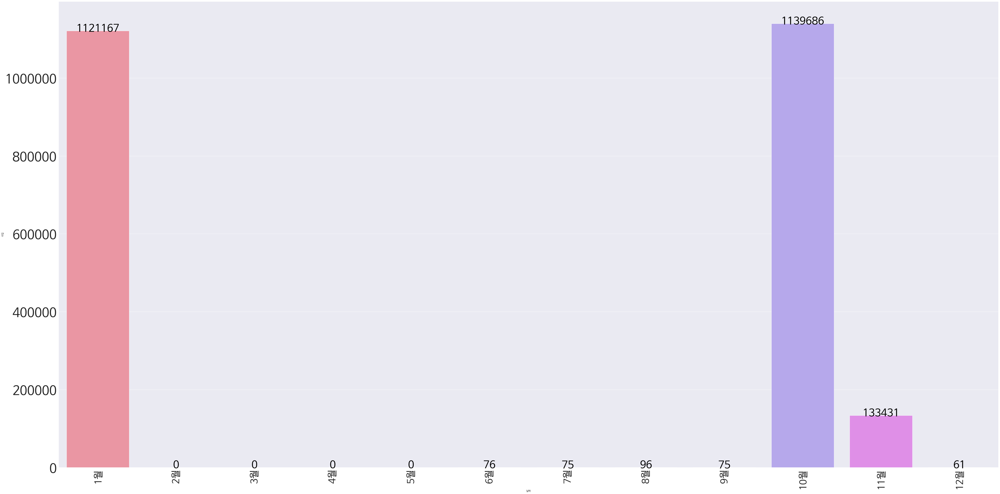

In [ ]:
g = sns.barplot(data=income_money ,x="날짜",y="수입", ci=None)
ax = g

sns.set(font="NanumBarunGothic", 
        rc={"axes.unicode_minus":False},
        style='darkgrid')
plt.rc('xtick', labelsize=60)  # x축 눈금 폰트 크기 
plt.rc('ytick', labelsize=60)
plt.rc('font', family='NanumBarunGothic') 
plt.xticks(fontsize=45, rotation=90)

rcParams['figure.figsize'] = 80, 40
current_values = plt.gca().get_yticks()
plt.gca().set_yticklabels(['{:.0f}'.format(x) for x in current_values])

for p in ax.patches: 
    ax.annotate("%.0f" % p.get_height(), (p.get_x() + p.get_width()/2., p.get_height() - 30), 
       ha='center', va='center', fontsize=50, color='black', xytext=(0, 10), 
       textcoords='offset points') 

plt.show()


## 인사이트 정리

1. 월 별로 가장 많이 쓴 달
  : 
### **10월에 1,617,950원 지출!**

2. 지출 금액이 가장 높았던 사업명과 금액
 :
### **과 돕바 공동구매에 1,020,000원 지출!**


# 화학분자공학과

In [ ]:
df_3 = pd.read_excel('2022년 화분공 결산안.xlsx', sheet_name='결산안')

In [ ]:
df_3.head()

,Unnamed: 0,날짜,내용,수입,지출,잔액,사업,세부항목,영수증
0,NaN,2022.01.17,2021년 화분공,1604493,0,1604493,총무부 인수인계,2021년도 학생회비 인수인계,x
1,NaN,2022.02.08,조아기프트(계좌이체),0,263912,1340581,학위수여식,학위수여식 기념품결제(장서방:우드쇼 큐브 리얼 우드 시계_흑경6560*32+인쇄비3...,1
2,NaN,2022.02.24,선물하기-카카오톡,0,21000,1319581,화학과 신입생 OT,"OT 이벤트 상품 결제(맥도날드 베이컨 토마토 디럭스 세트 7000*3)-강윤지, ...","2,3,4"
3,NaN,2022.02.24,선물하기-카카오톡,0,22800,1296781,화학과 신입생 OT,"OT 이벤트 상품 결제(서브웨이 이탈리안비엠티 7600*3)-강민서, 김민서, 하은미","5,6,7"
4,NaN,2022.02.26,결산이자,99,0,1296880,이자세금,이자세금,x


In [ ]:
df_3 = df_3.drop('Unnamed: 0',axis=1)

In [ ]:
def to_month(month_num):
    month = ''
    if 1<= month_num < 2:
        month = '1월'
    elif 2<= month_num < 3:
        month = '2월'
    elif 3<= month_num < 4:
        month = '3월'
    elif 4<= month_num < 5:
        month = '4월'
    elif 5<= month_num < 6:
        month = '5월'
    elif 6<= month_num < 7:
        month = '6월'
    elif 7<= month_num < 8:
        month = '7월'
    elif 8<= month_num < 9:
        month = '8월'
    elif 9<= month_num < 10:
        month = '9월'
    elif 10<= month_num < 11:
        month = '10월'
    elif 11<= month_num < 12:
        month = '11월'
    else:
        month = '12월'
        
    return month


In [ ]:
df_3['날짜'].replace('2022.10,06','2022-10-06', inplace=True)

In [ ]:
df_3["날짜"] = pd.to_datetime(df_3["날짜"], format='%Y-%m-%d')
df_3["날짜"] = pd.Categorical(
    df_3['날짜'].dt.month.apply(to_month), 
    categories = ['1월', '2월', '3월', '4월', '5월', '6월', '7월', '8월', '9월', '10월', '11월', '12월']
)

In [ ]:
# 사업의 종류
print(df_3['사업'].unique())


# 총 수입
print(df_3['수입'].sum())


# 총 지출
print(df_3['지출'].sum())

d = df_3['지출'].sum()
Spend.append(d)

['총무부 인수인계' '학위수여식' '화학과 신입생 OT' '이자세금' '신입생편지' '화학과 신입생 계산기 공동구매'
 '화학과 신입생 과잠 공동구매' '졸업생 선물 배송' '체육기자재 구입' '학생회비 입금' '화학과 중간고사 야식사업'
 '과방 필요 용품 구매' '스승의 날' '네이버페이 카드등록 인증' '축제물자구입' '롤링페이퍼 작성 선물' '쿠팡 카드등록 인증'
 '싸테챔 음료 지원' '축제수익금' '화학과 기말고사 야식사업' '종강총회' '단과대 감사' '꿈꾸는 배움터 ' '개강총회'
 '체육활동 필요 물품 구입' '체육대회' ' 23년도 회장단 선거 투표 ' '23년도 회장단 선거']
9346755
8906792


In [ ]:
# 잔액
# 화학분자공학과는 439963원 남음.

print(df_3['수입'].sum() - df_3['지출'].sum())

439963


## 사업별 지출, 수입 그래프

In [ ]:
sum_event = df_3.groupby('사업').sum()
sum_event = sum_event.reset_index()
sum_event

,사업,수입,지출,잔액
0,23년도 회장단 선거 투표,0,10400,489188
1,23년도 회장단 선거,0,9400,964976
2,개강총회,0,265500,2280226
3,과방 필요 용품 구매,0,20500,6271174
4,꿈꾸는 배움터,35600,1307760,8981103
5,네이버페이 카드등록 인증,1,0,3507397
6,단과대 감사,0,10000,2724648
7,롤링페이퍼 작성 선물,0,67500,2774597
8,스승의 날,0,237300,22717992
9,신입생편지,0,16350,1280530


In [ ]:
Total_StudentIncome4 = df_3.loc[df_3['사업'].str.contains('학생회비', na = False), '수입'].sum()


SCF.append(Total_StudentIncome4)

In [ ]:
Snack4 = df_3.loc[df_3['사업'].str.contains('야식', na = False), '지출'].sum()

Snack_Money.append(Snack4)

### 사업별 수입 그래프

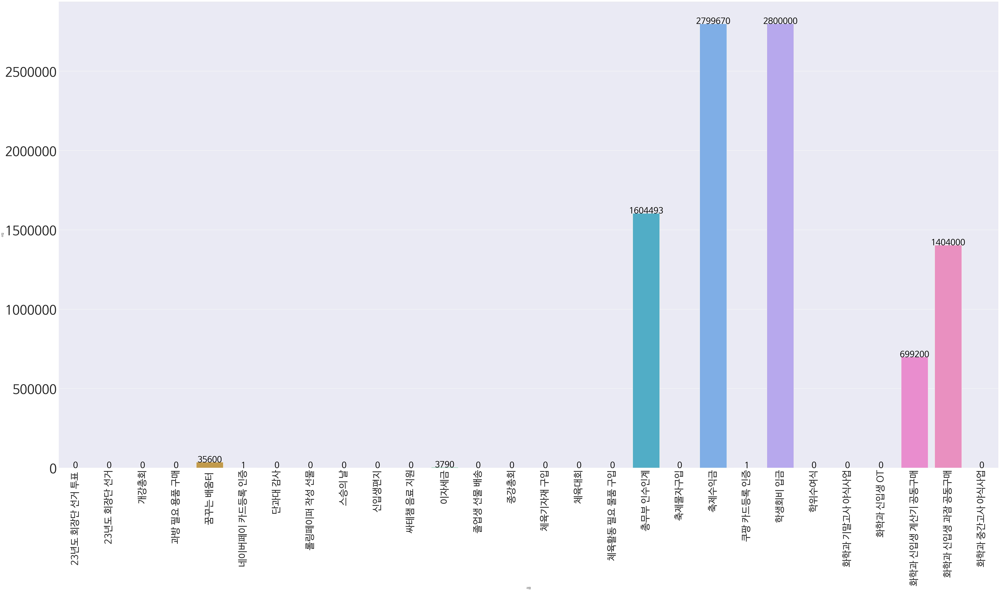

In [ ]:
g = sns.barplot(data=sum_event, x="사업",y="수입", ci=None)
ax = g

sns.set(font="NanumBarunGothic", 
        rc={"axes.unicode_minus":False},
        style='darkgrid')
plt.rc('xtick', labelsize=60)  # x축 눈금 폰트 크기 
plt.rc('ytick', labelsize=60)
plt.rc('font', family='NanumBarunGothic') 
plt.xticks(fontsize=45, rotation=90)

rcParams['figure.figsize'] = 80, 40
current_values = plt.gca().get_yticks()
plt.gca().set_yticklabels(['{:.0f}'.format(x) for x in current_values])

for p in ax.patches: 
    ax.annotate("%.0f" % p.get_height(), (p.get_x() + p.get_width()/2., p.get_height() - 30), 
       ha='center', va='center', fontsize=40, color='black', xytext=(0, 10), 
       textcoords='offset points') 

plt.show()


### 사업별 지출 그래프


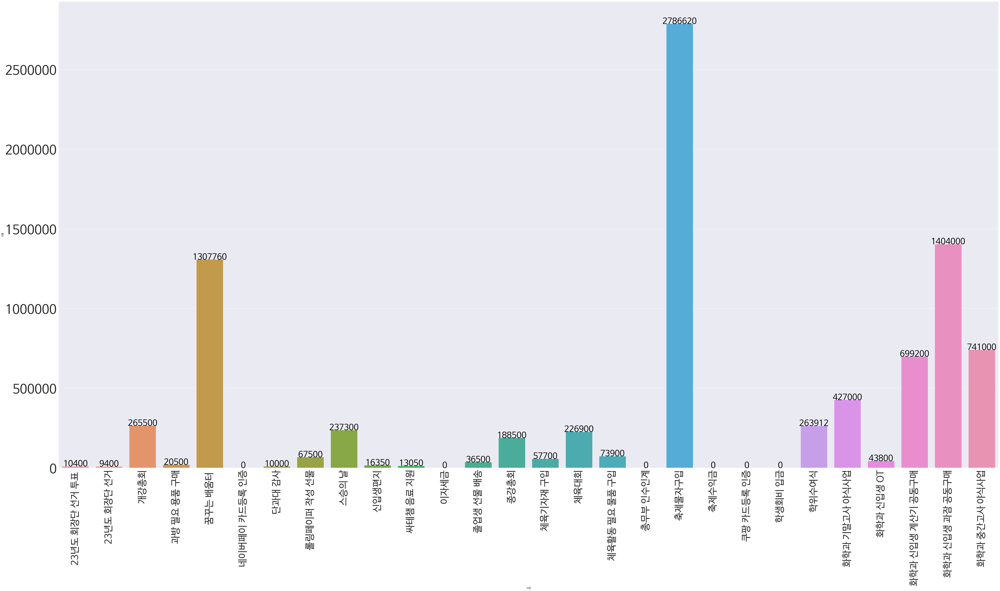

In [ ]:
g = sns.barplot(data=sum_event, x="사업",y="지출", ci=None)
ax = g

sns.set(font="NanumBarunGothic", 
        rc={"axes.unicode_minus":False},
        style='darkgrid')
plt.rc('xtick', labelsize=60)  # x축 눈금 폰트 크기 
plt.rc('ytick', labelsize=60)
plt.rc('font', family='NanumBarunGothic') 
plt.xticks(fontsize=45, rotation=90)

rcParams['figure.figsize'] = 80, 40
current_values = plt.gca().get_yticks()
plt.gca().set_yticklabels(['{:.0f}'.format(x) for x in current_values])

for p in ax.patches: 
    ax.annotate("%.0f" % p.get_height(), (p.get_x() + p.get_width()/2., p.get_height() - 30), 
       ha='center', va='center', fontsize=40, color='black', xytext=(0, 10), 
       textcoords='offset points') 

plt.show()


## 월별 토탈

In [ ]:
spend_money = df_3.groupby('날짜')['지출'].sum()
spend_money = spend_money.reset_index()
spend_money


,날짜,지출
0,1월,0
1,2월,324062
2,3월,2197400
3,4월,452500
4,5월,3104470
5,6월,496500
6,7월,89000
7,8월,1236560
8,9월,365300
9,10월,551200


In [ ]:
# 월 별로 가장 많이 쓴 달
## 5월에 3104470원 지출!
spend_money.iloc[spend_money['지출'].idxmax()]


날짜         5월
지출    3104470
Name: 4, dtype: object

In [ ]:
income_money = df_3.groupby('날짜')['수입'].sum()
income_money = income_money.reset_index()
income_money


,날짜,수입
0,1월,1604493
1,2월,99
2,3월,2103323
3,4월,2800202
4,5월,2799933
5,6월,1530
6,7월,403
7,8월,222
8,9월,35686
9,10월,658


### 월별 지출 그래프


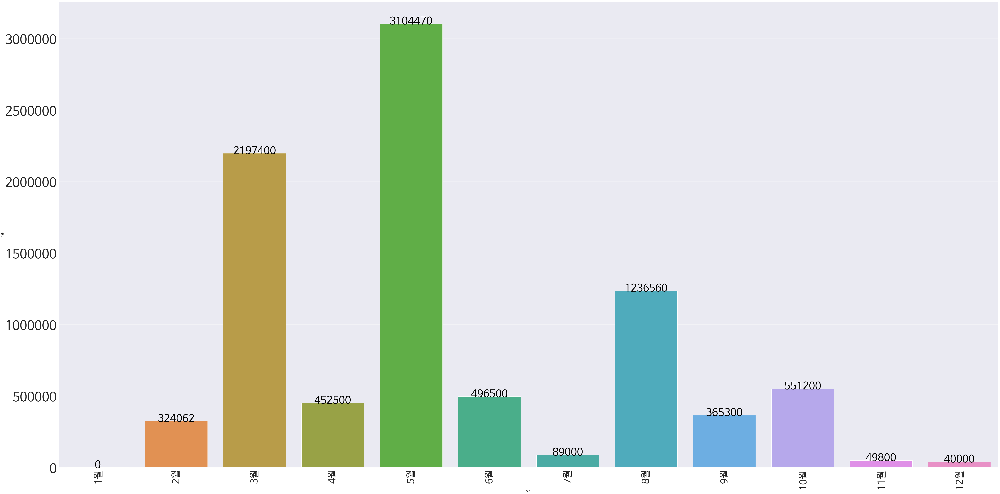

In [ ]:
g = sns.barplot(data= spend_money ,x= "날짜",y= "지출", ci=None)
ax = g

sns.set(font="NanumBarunGothic", 
        rc={"axes.unicode_minus":False},
        style='darkgrid')
plt.rc('xtick', labelsize=60)  # x축 눈금 폰트 크기 
plt.rc('ytick', labelsize=60)
plt.rc('font', family='NanumBarunGothic') 
plt.xticks(fontsize=45, rotation=90)

rcParams['figure.figsize'] = 80, 40
current_values = plt.gca().get_yticks()
plt.gca().set_yticklabels(['{:.0f}'.format(x) for x in current_values])

for p in ax.patches: 
    ax.annotate("%.0f" % p.get_height(), (p.get_x() + p.get_width()/2., p.get_height() - 30), 
       ha='center', va='center', fontsize=50, color='black', xytext=(0, 10), 
       textcoords='offset points') 

plt.show()

### 월별 수입 그래프


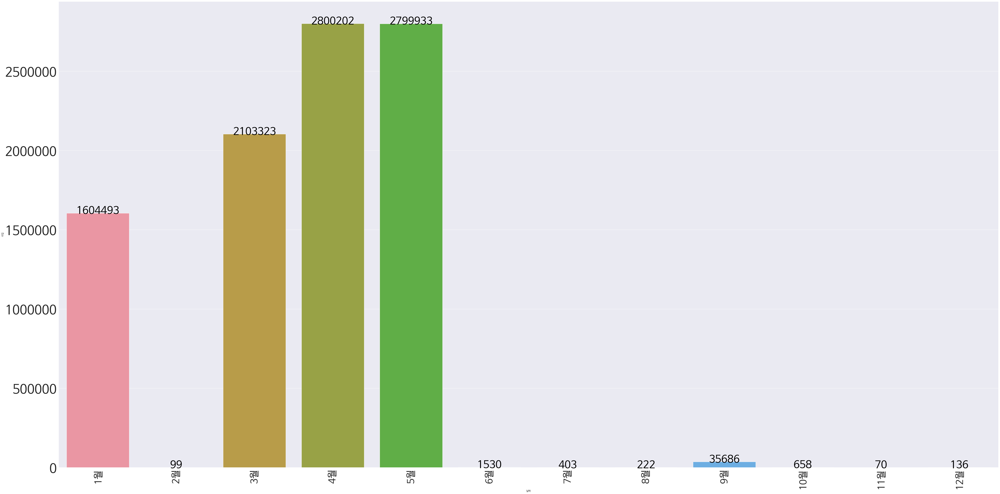

In [ ]:
g = sns.barplot(data=income_money ,x="날짜",y="수입", ci=None)
ax = g

sns.set(font="NanumBarunGothic", 
        rc={"axes.unicode_minus":False},
        style='darkgrid')
plt.rc('xtick', labelsize=60)  # x축 눈금 폰트 크기 
plt.rc('ytick', labelsize=60)
plt.rc('font', family='NanumBarunGothic') 
plt.xticks(fontsize=45, rotation=90)

rcParams['figure.figsize'] = 80, 40
current_values = plt.gca().get_yticks()
plt.gca().set_yticklabels(['{:.0f}'.format(x) for x in current_values])

for p in ax.patches: 
    ax.annotate("%.0f" % p.get_height(), (p.get_x() + p.get_width()/2., p.get_height() - 30), 
       ha='center', va='center', fontsize=50, color='black', xytext=(0, 10), 
       textcoords='offset points') 

plt.show()


## 인사이트 정리

1. 월 별로 가장 많이 쓴 달
  : 
### **5월에 3,104,470원 지출!**

2. 지출 금액이 가장 높았던 사업명과 금액
 :
### **축제물자구입에 2,786,620원 지출!**


# 해양융합공학과

In [ ]:
df_4 = pd.read_excel('2022_2학기_중앙감사_해양융합공학과.xlsx', sheet_name='결산안')

In [ ]:
df_4.head()

,날짜,내용,수입,지출,잔액,사업,세부항목,영수증유무
0,2022-06-25,정연숙_감사비,0,10000,1805982,감사장학금,과학기술융합대학 감사,○
1,2022-07-01,주식회사대부도,0,670000,1135982,해양과 연합 엠티,"대부도 펜션 밸리 - 세라피나 독채펜션 예약 ( 기본 540,000원 + 추가인원 ...",○
2,2022-08-01,신한할인캐쉬백,3985,0,1139967,통장이자,통장이자,△
3,2022-08-02,카카오선물하기,0,5000,1134967,1학기 혜윰해융,김용준 팀 - 이디야 디지털 상품권 5천원권,○
4,2022-08-02,카카오선물용준,0,10000,1124967,1학기 혜윰해융,김용준 팀 - 이디야 디지털 상품권 1만원권,○


In [ ]:
def to_month(month_num):
    month = ''
    if 1<= month_num < 2:
        month = '1월'
    elif 2<= month_num < 3:
        month = '2월'
    elif 3<= month_num < 4:
        month = '3월'
    elif 4<= month_num < 5:
        month = '4월'
    elif 5<= month_num < 6:
        month = '5월'
    elif 6<= month_num < 7:
        month = '6월'
    elif 7<= month_num < 8:
        month = '7월'
    elif 8<= month_num < 9:
        month = '8월'
    elif 9<= month_num < 10:
        month = '9월'
    elif 10<= month_num < 11:
        month = '10월'
    elif 11<= month_num < 12:
        month = '11월'
    else:
        month = '12월'
        
    return month


In [ ]:
df_4["날짜"] = pd.to_datetime(df_4["날짜"], format='%Y-%m-%d')
df_4["날짜"] = pd.Categorical(
    df_4['날짜'].dt.month.apply(to_month), 
    categories = ['1월', '2월', '3월', '4월', '5월', '6월', '7월', '8월', '9월', '10월', '11월', '12월']
)


In [ ]:
# 사업의 종류
print(df_4['사업'].unique())


# 총 수입
print(df_4['수입'].sum())


# 총 지출
print(df_4['지출'].sum())

e = df_4['지출'].sum()
Spend.append(e)

['감사장학금' '해양과 연합 엠티' '통장이자' '1학기 혜윰해융' '카니발' '꿈꾸는 배움터' '바람막이 공동구매'
 '카카오_카카오' '개총감자튀김' '학생회비 이월' '과티 공동구매' '야식사업' '2학기 혜윰해융' '통장 캐시백' '-']
3186099
3402250


In [ ]:
# 잔액
# 해양융합공학과는 지출이 -216151원 over 되었음을 알 수 있음

print(df_4['수입'].sum() - df_4['지출'].sum())

-216151


## 사업별 지출, 수입 그래프


In [ ]:
sum_event = df_4.groupby('사업').sum()
sum_event = sum_event.reset_index()
sum_event


,사업,수입,지출,잔액
0,-,61100,61100,14659804
1,1학기 혜윰해융,0,143000,12962604
2,2학기 혜윰해융,0,43000,5243161
3,감사장학금,0,10000,1805982
4,개총감자튀김,0,13000,1496967
5,과티 공동구매,140000,182000,72081625
6,꿈꾸는 배움터,0,140150,3859751
7,바람막이 공동구매,859000,881000,46443208
8,야식사업,0,150000,2672865
9,카니발,9900,59400,2772301


In [ ]:
Total_StudentIncome5 = df_4.loc[df_4['사업'].str.contains('학생회비', na = False), '수입'].sum()


SCF.append(Total_StudentIncome5)

In [ ]:
Snack5 = df_4.loc[df_4['사업'].str.contains('야식', na = False), '지출'].sum()

Snack_Money.append(Snack5)

### 사업별 수입 그래프


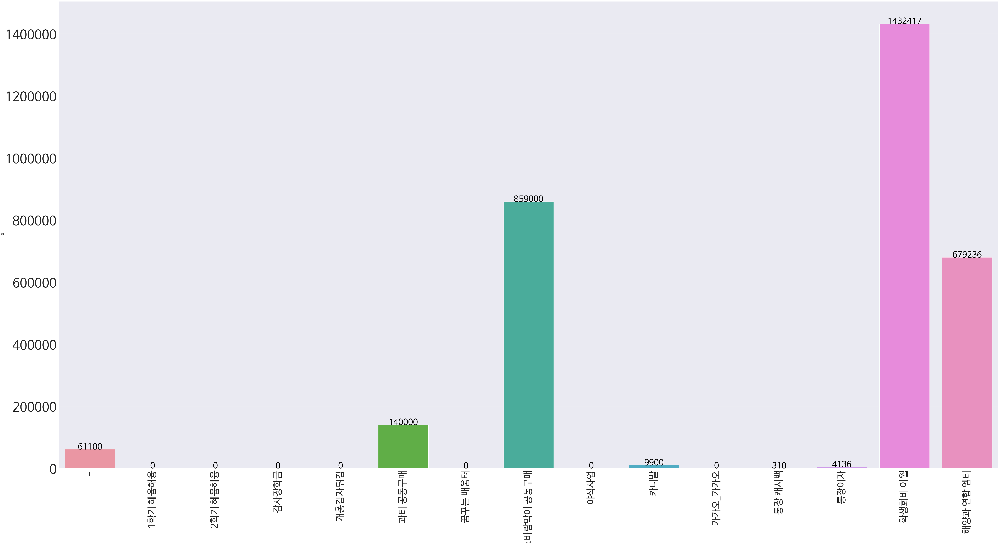

In [ ]:
g = sns.barplot(data=sum_event, x="사업",y="수입", ci=None)
ax = g

sns.set(font="NanumBarunGothic", 
        rc={"axes.unicode_minus":False},
        style='darkgrid')
plt.rc('xtick', labelsize=60)  # x축 눈금 폰트 크기 
plt.rc('ytick', labelsize=60)
plt.rc('font', family='NanumBarunGothic') 
plt.xticks(fontsize=45, rotation=90)

rcParams['figure.figsize'] = 80, 40
current_values = plt.gca().get_yticks()
plt.gca().set_yticklabels(['{:.0f}'.format(x) for x in current_values])

for p in ax.patches: 
    ax.annotate("%.0f" % p.get_height(), (p.get_x() + p.get_width()/2., p.get_height() - 30), 
       ha='center', va='center', fontsize=40, color='black', xytext=(0, 10), 
       textcoords='offset points') 

plt.show()


### 사업별 지출 그래프


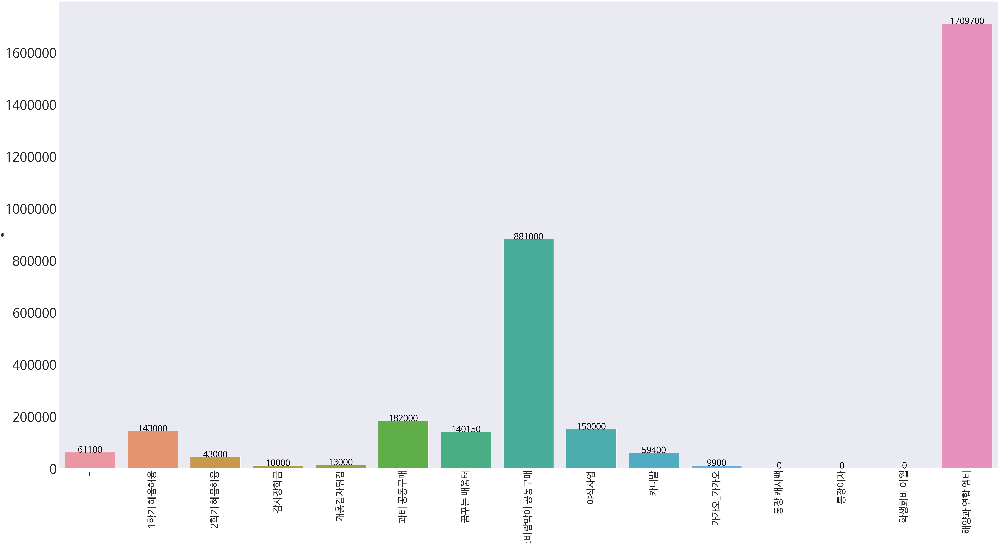

In [ ]:
g = sns.barplot(data=sum_event, x="사업",y="지출", ci=None)
ax = g

sns.set(font="NanumBarunGothic", 
        rc={"axes.unicode_minus":False},
        style='darkgrid')
plt.rc('xtick', labelsize=60)  # x축 눈금 폰트 크기 
plt.rc('ytick', labelsize=60)
plt.rc('font', family='NanumBarunGothic') 
plt.xticks(fontsize=45, rotation=90)

rcParams['figure.figsize'] = 80, 40
current_values = plt.gca().get_yticks()
plt.gca().set_yticklabels(['{:.0f}'.format(x) for x in current_values])

for p in ax.patches: 
    ax.annotate("%.0f" % p.get_height(), (p.get_x() + p.get_width()/2., p.get_height() - 30), 
       ha='center', va='center', fontsize=40, color='black', xytext=(0, 10), 
       textcoords='offset points') 

plt.show()

## 월별 토탈


In [ ]:
spend_money = df_4.groupby('날짜')['지출'].sum()
spend_money = spend_money.reset_index()
spend_money


,날짜,지출
0,1월,0
1,2월,0
2,3월,0
3,4월,0
4,5월,0
5,6월,10000
6,7월,670000
7,8월,242400
8,9월,1186050
9,10월,1002600


In [ ]:
# 월 별로 가장 많이 쓴 달
## 9월에 1186050원 지출!
spend_money.iloc[spend_money['지출'].idxmax()]

날짜         9월
지출    1186050
Name: 8, dtype: object

In [ ]:
income_money = df_4.groupby('날짜')['수입'].sum()
income_money = income_money.reset_index()
income_money


,날짜,수입
0,1월,0
1,2월,0
2,3월,0
3,4월,0
4,5월,0
5,6월,0
6,7월,0
7,8월,1175885
8,9월,1915448
9,10월,24081


### 월별 지출 그래프


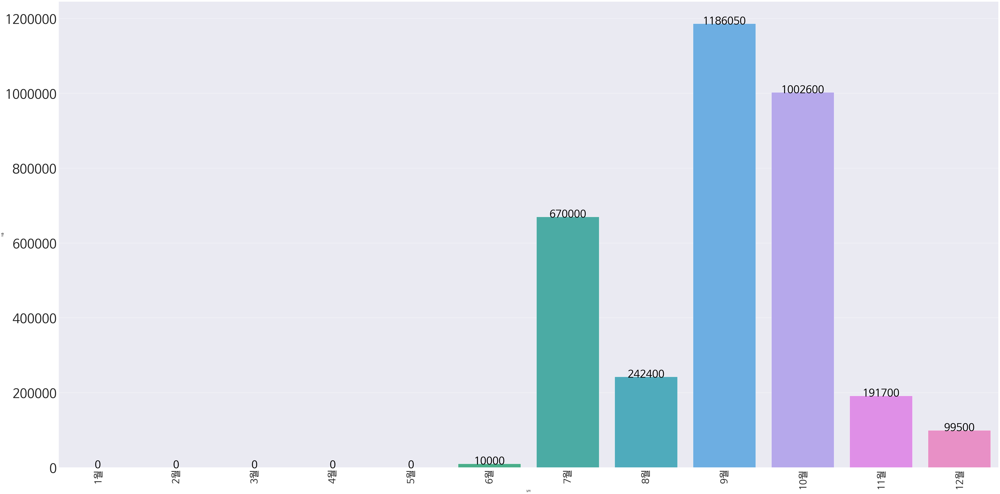

In [ ]:
g = sns.barplot(data= spend_money ,x= "날짜",y= "지출", ci=None)
ax = g

sns.set(font="NanumBarunGothic", 
        rc={"axes.unicode_minus":False},
        style='darkgrid')
plt.rc('xtick', labelsize=60)  # x축 눈금 폰트 크기 
plt.rc('ytick', labelsize=60)
plt.rc('font', family='NanumBarunGothic') 
plt.xticks(fontsize=45, rotation=90)

rcParams['figure.figsize'] = 80, 40
current_values = plt.gca().get_yticks()
plt.gca().set_yticklabels(['{:.0f}'.format(x) for x in current_values])

for p in ax.patches: 
    ax.annotate("%.0f" % p.get_height(), (p.get_x() + p.get_width()/2., p.get_height() - 30), 
       ha='center', va='center', fontsize=50, color='black', xytext=(0, 10), 
       textcoords='offset points') 

plt.show()


### 월별 수입 그래프


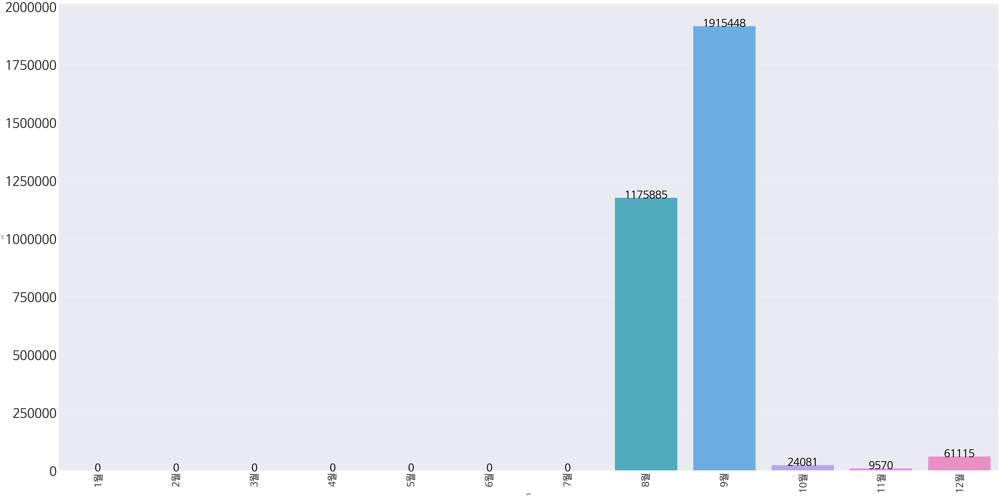

In [ ]:
g = sns.barplot(data=income_money ,x="날짜",y="수입", ci=None)
ax = g

sns.set(font="NanumBarunGothic", 
        rc={"axes.unicode_minus":False},
        style='darkgrid')
plt.rc('xtick', labelsize=60)  # x축 눈금 폰트 크기 
plt.rc('ytick', labelsize=60)
plt.rc('font', family='NanumBarunGothic') 
plt.xticks(fontsize=45, rotation=90)

rcParams['figure.figsize'] = 80, 40
current_values = plt.gca().get_yticks()
plt.gca().set_yticklabels(['{:.0f}'.format(x) for x in current_values])

for p in ax.patches: 
    ax.annotate("%.0f" % p.get_height(), (p.get_x() + p.get_width()/2., p.get_height() - 30), 
       ha='center', va='center', fontsize=50, color='black', xytext=(0, 10), 
       textcoords='offset points') 

plt.show()


## 인사이트 정리

1. 월 별로 가장 많이 쓴 달
  : 
### **9월에 1,186,050원 지출!**

2. 지출 금액이 가장 높았던 사업명과 금액
 :
### **해양과 연합 MT에 1,709,700원 지출!**


# 응용물리학과

In [ ]:
df_5 = pd.read_excel('2022_2학기_중앙감사_과기대_응용물리학과.xlsx', sheet_name='결산안')

In [ ]:
df_5.head()

,Unnamed: 0,날짜,내용,수입,지출,잔액,사업,세부항목,영수증,영수증유무
0,NaN,2022-01-01 00:00:00,학생회 임기 시작,0,0,0,NaN,NaN,NaN,NaN
1,NaN,2022-01-02 00:00:00,전년도 학생회비 이월,789716,0,789716,전년도 학생회비 이월,전년도 학생회비 이월,NaN,X
2,NaN,2022-01-29 00:00:00,입출금통장 이자,38,0,789754,기타,이자,NaN,X
3,NaN,2022-02-07 00:00:00,계좌확인용 입금,1,0,789755,기타,계좌확인용 입금,NaN,X
4,NaN,2022-02-07 00:00:00,피비엘실 물품구비,0,95880,693875,피비엘실물품구비,삼성복합기,1.0,O


In [ ]:
df_5 = df_5.drop('Unnamed: 0',axis=1)

In [ ]:
def to_month(month_num):
    month = ''
    if 1<= month_num < 2:
        month = '1월'
    elif 2<= month_num < 3:
        month = '2월'
    elif 3<= month_num < 4:
        month = '3월'
    elif 4<= month_num < 5:
        month = '4월'
    elif 5<= month_num < 6:
        month = '5월'
    elif 6<= month_num < 7:
        month = '6월'
    elif 7<= month_num < 8:
        month = '7월'
    elif 8<= month_num < 9:
        month = '8월'
    elif 9<= month_num < 10:
        month = '9월'
    elif 10<= month_num < 11:
        month = '10월'
    elif 11<= month_num < 12:
        month = '11월'
    else:
        month = '12월'
        
    return month


In [ ]:
df_5["날짜"].replace('2022.3.11.', '2022-03-11', inplace=True)

In [ ]:
df_5["날짜"] = pd.to_datetime(df_5["날짜"], format='%Y-%m-%d')
df_5["날짜"] = pd.Categorical(
    df_5['날짜'].dt.month.apply(to_month), 
    categories = ['1월', '2월', '3월', '4월', '5월', '6월', '7월', '8월', '9월', '10월', '11월', '12월']
)

In [ ]:
# 사업의 종류
print(df_5['사업'].unique())


# 총 수입
print(df_5['수입'].sum())


# 총 지출
print(df_5['지출'].sum())

f = df_5['지출'].sum()
Spend.append(f)

[nan '전년도 학생회비 이월' '기타' '피비엘실물품구비' '공동구매' '개강총회' '신환회상품지급' '개강총회상품지급'
 'GP 지원금 입금' 'GP 지원금 지급' '딸기 축제 행사' '학생회비 입금' '야식사업 ' '주점 축제 행사 '
 '스승의 날 행사' '롤링페이퍼 재료' '입출금오류' '종강총회' 'MT' '꿈터행사' '피비엘실 청소' '체육대회' '선거']
13471305
12670541


In [ ]:
# 잔액
# 응용물리학과는 800764원이 남음

print(df_5['수입'].sum() - df_5['지출'].sum())

800764


## 사업별 지출, 수입 그래프


In [ ]:
sum_event = df_5.groupby('사업').sum()
sum_event = sum_event.reset_index()
sum_event


,사업,수입,지출,잔액,영수증
0,GP 지원금 입금,1650000,0,1816429,15.0
1,GP 지원금 지급,0,1650000,10080719,165.0
2,MT,2300000,3673175,10406875,676.0
3,개강총회,0,250000,1847018,85.0
4,개강총회상품지급,0,30000,166429,14.0
5,공동구매,2172480,1678180,75342652,830.0
6,기타,5433,0,18685049,965.0
7,꿈터행사,80400,177150,4640062,284.0
8,딸기 축제 행사,90000,370000,10198780,140.0
9,롤링페이퍼 재료,0,15800,554926,34.0


In [ ]:
Total_StudentIncome6 = df_5.loc[df_5['사업'].str.contains('학생회비', na = False), '수입'].sum()


SCF.append(Total_StudentIncome6)

In [ ]:
Snack6 = df_5.loc[df_5['사업'].str.contains('야식', na = False), '지출'].sum()

Snack_Money.append(Snack6)

### 사업별 수입 그래프


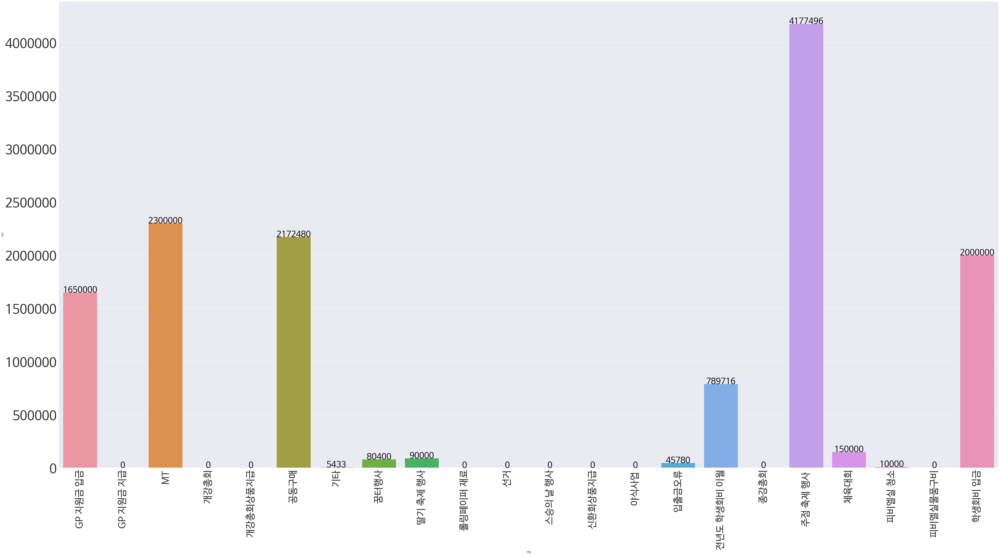

In [ ]:
g = sns.barplot(data=sum_event, x="사업",y="수입", ci=None)
ax = g

sns.set(font="NanumBarunGothic", 
        rc={"axes.unicode_minus":False},
        style='darkgrid')
plt.rc('xtick', labelsize=60)  # x축 눈금 폰트 크기 
plt.rc('ytick', labelsize=60)
plt.rc('font', family='NanumBarunGothic') 
plt.xticks(fontsize=45, rotation=90)

rcParams['figure.figsize'] = 80, 40
current_values = plt.gca().get_yticks()
plt.gca().set_yticklabels(['{:.0f}'.format(x) for x in current_values])

for p in ax.patches: 
    ax.annotate("%.0f" % p.get_height(), (p.get_x() + p.get_width()/2., p.get_height() - 30), 
       ha='center', va='center', fontsize=40, color='black', xytext=(0, 10), 
       textcoords='offset points') 

plt.show()


### 사업별 지출 그래프


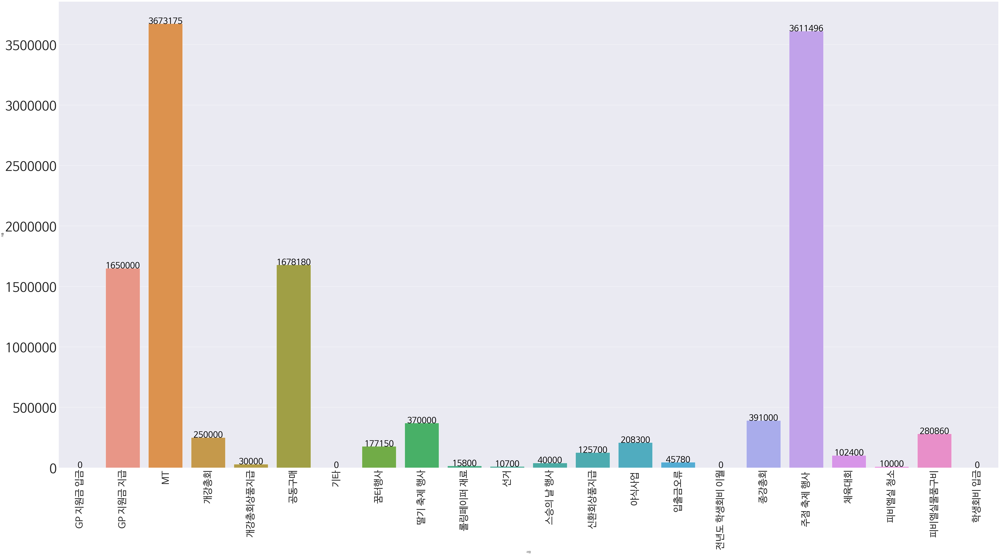

In [ ]:
g = sns.barplot(data=sum_event, x="사업",y="지출", ci=None)
ax = g

sns.set(font="NanumBarunGothic", 
        rc={"axes.unicode_minus":False},
        style='darkgrid')
plt.rc('xtick', labelsize=60)  # x축 눈금 폰트 크기 
plt.rc('ytick', labelsize=60)
plt.rc('font', family='NanumBarunGothic') 
plt.xticks(fontsize=45, rotation=90)

rcParams['figure.figsize'] = 80, 40
current_values = plt.gca().get_yticks()
plt.gca().set_yticklabels(['{:.0f}'.format(x) for x in current_values])

for p in ax.patches: 
    ax.annotate("%.0f" % p.get_height(), (p.get_x() + p.get_width()/2., p.get_height() - 30), 
       ha='center', va='center', fontsize=40, color='black', xytext=(0, 10), 
       textcoords='offset points') 

plt.show()


## 월별 토탈


In [ ]:
spend_money = df_5.groupby('날짜')['지출'].sum()
spend_money = spend_money.reset_index()
spend_money


,날짜,지출
0,1월,0
1,2월,255530
2,3월,3693880
3,4월,578300
4,5월,2671896
5,6월,1301000
6,7월,1008800
7,8월,1360035
8,9월,1567680
9,10월,127730


In [ ]:
# 월 별로 가장 많이 쓴 달
## 3월에 3693880원 지출!
spend_money.iloc[spend_money['지출'].idxmax()]

날짜         3월
지출    3693880
Name: 2, dtype: object

In [ ]:
income_money = df_5.groupby('날짜')['수입'].sum()
income_money = income_money.reset_index()
income_money


,날짜,수입
0,1월,799754
1,2월,48
2,3월,3822873
3,4월,2090760
4,5월,1000512
5,6월,3183691
6,7월,9528
7,8월,2322503
8,9월,86546
9,10월,150035


### 월별 지출 그래프


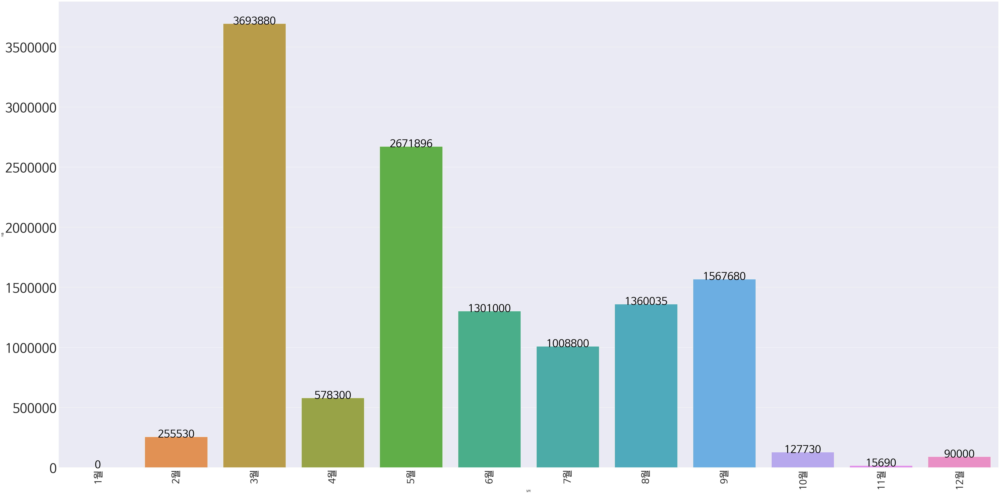

In [ ]:
g = sns.barplot(data= spend_money ,x= "날짜",y= "지출", ci=None)
ax = g

sns.set(font="NanumBarunGothic", 
        rc={"axes.unicode_minus":False},
        style='darkgrid')
plt.rc('xtick', labelsize=60)  # x축 눈금 폰트 크기 
plt.rc('ytick', labelsize=60)
plt.rc('font', family='NanumBarunGothic') 
plt.xticks(fontsize=45, rotation=90)

rcParams['figure.figsize'] = 80, 40
current_values = plt.gca().get_yticks()
plt.gca().set_yticklabels(['{:.0f}'.format(x) for x in current_values])

for p in ax.patches: 
    ax.annotate("%.0f" % p.get_height(), (p.get_x() + p.get_width()/2., p.get_height() - 30), 
       ha='center', va='center', fontsize=50, color='black', xytext=(0, 10), 
       textcoords='offset points') 

plt.show()


### 월별 수입 그래프


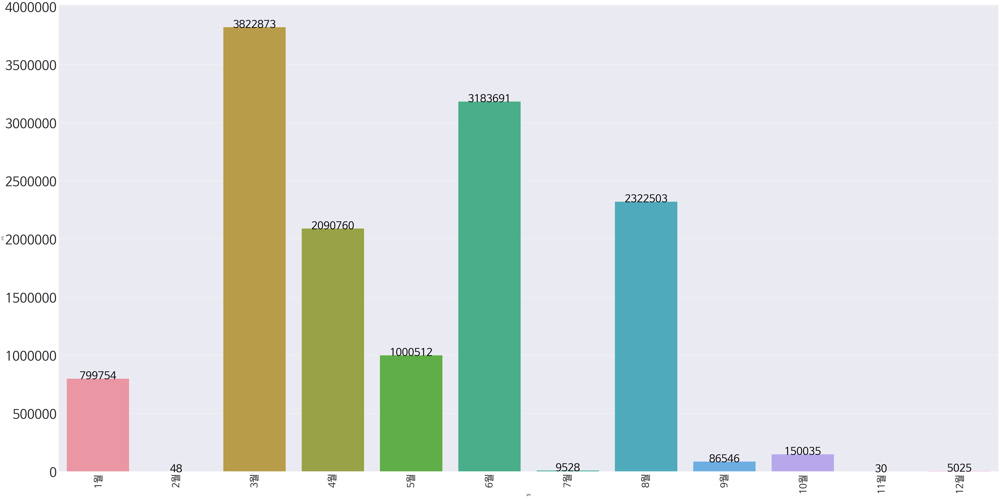

In [ ]:
g = sns.barplot(data=income_money ,x="날짜",y="수입", ci=None)
ax = g

sns.set(font="NanumBarunGothic", 
        rc={"axes.unicode_minus":False},
        style='darkgrid')
plt.rc('xtick', labelsize=60)  # x축 눈금 폰트 크기 
plt.rc('ytick', labelsize=60)
plt.rc('font', family='NanumBarunGothic') 
plt.xticks(fontsize=45, rotation=90)

rcParams['figure.figsize'] = 80, 40
current_values = plt.gca().get_yticks()
plt.gca().set_yticklabels(['{:.0f}'.format(x) for x in current_values])

for p in ax.patches: 
    ax.annotate("%.0f" % p.get_height(), (p.get_x() + p.get_width()/2., p.get_height() - 30), 
       ha='center', va='center', fontsize=50, color='black', xytext=(0, 10), 
       textcoords='offset points') 

plt.show()



## 인사이트 정리

1. 월 별로 가장 많이 쓴 달
  : 
### **3월에 3,693,880원 지출!**

2. 지출 금액이 가장 높았던 사업명과 금액
 :
### **MT에 3,673,175원 지출!**


# 전체 인사이트 정리

1. 2022-2학기 지출이 가장 큰 학과는?
  
  **응용물리학과**

In [ ]:
# 과기대 학생회, 분자생명과학과, 나노광전자학과, 화학분자공학과, 해양융합공학과, 응용물리학과
Spend

[6155080, 9945700, 2236030, 8906792, 3402250, 12670541]

In [ ]:
Spend_dic = {
    '과기대 학생회': 6155080,
    '분자생명과학과': 9945700,
    '나노광전자학과': 2236030,
    '화학분자공학과': 8906792,
    '해양융합공학과': 3402250,
    '응용물리학과': 12670541
}

df_Spend = pd.DataFrame(list(Spend_dic.items()), columns=['학과', '지출'])
df_Spend

,학과,지출
0,과기대 학생회,6155080
1,분자생명과학과,9945700
2,나노광전자학과,2236030
3,화학분자공학과,8906792
4,해양융합공학과,3402250
5,응용물리학과,12670541


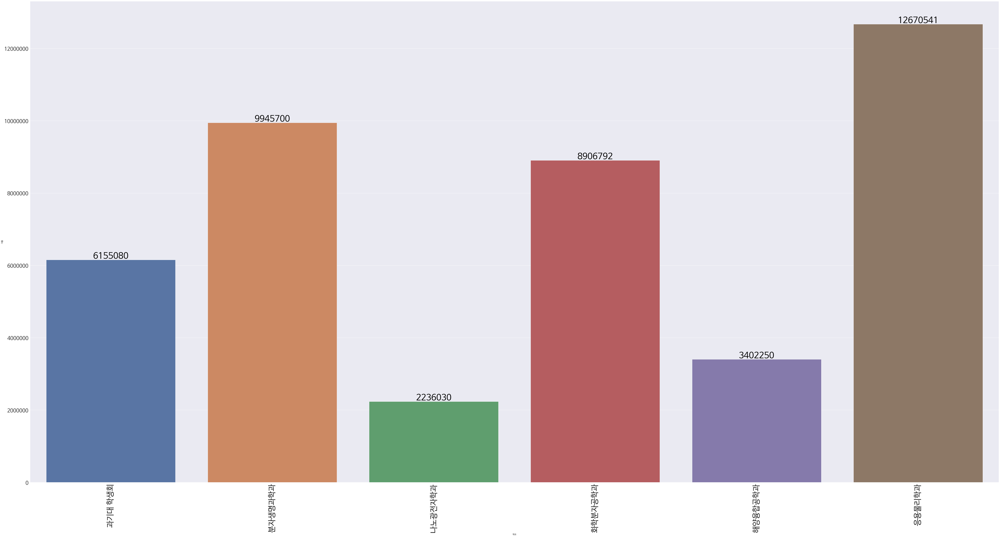

In [ ]:
g = sns.barplot(data=df_Spend ,x="학과",y="지출", ci=None)
ax = g

sns.set(font="NanumBarunGothic", 
        rc={"axes.unicode_minus":False},
        style='darkgrid')
plt.rc('xtick', labelsize=30)  # x축 눈금 폰트 크기 
plt.rc('ytick', labelsize=30)
plt.rc('font', family='NanumBarunGothic') 
plt.xticks(fontsize=45, rotation=90)

rcParams['figure.figsize'] = 80, 50
current_values = plt.gca().get_yticks()
plt.gca().set_yticklabels(['{:.0f}'.format(x) for x in current_values])

for p in ax.patches: 
    ax.annotate("%.0f" % p.get_height(), (p.get_x() + p.get_width()/2., p.get_height() - 30), 
       ha='center', va='center', fontsize=50, color='black', xytext=(0, 20), 
       textcoords='offset points') 

plt.show()


2. 2022-2학기 학생회비가 가장 많이 모인 학과는?

  **분자생명과학과**


In [ ]:
# 과기대 학생회, 분자생명과학과, 나노광전자학과, 화학분자공학과, 해양융합공학과, 응용물리학과
SCF

[1716010, 3582482, 1121167, 2800000, 1432417, 2789716]

In [ ]:
SCF_dic = {
    '과기대 학생회': 1716010,
    '분자생명과학과': 3582482,
    '나노광전자학과': 1121167,
    '화학분자공학과': 2800000,
    '해양융합공학과': 1432417,
    '응용물리학과': 2789716
}

df_SCF = pd.DataFrame(list(SCF_dic.items()), columns=['학과', '학생회비 INCOME'])
df_SCF

,학과,학생회비 INCOME
0,과기대 학생회,1716010
1,분자생명과학과,3582482
2,나노광전자학과,1121167
3,화학분자공학과,2800000
4,해양융합공학과,1432417
5,응용물리학과,2789716


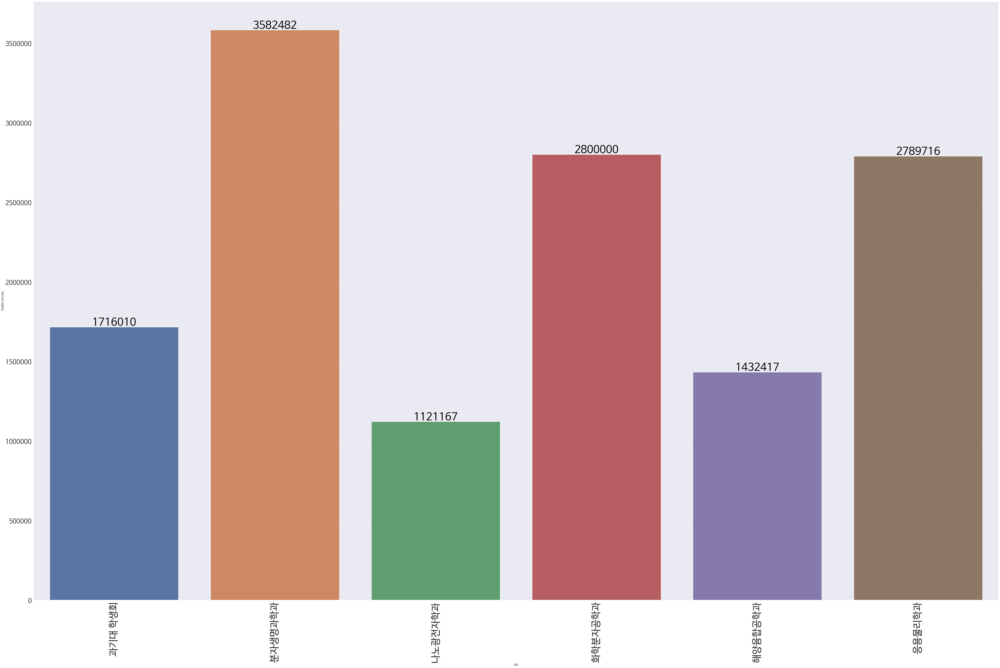

In [ ]:
g = sns.barplot(data=df_SCF ,x="학과",y="학생회비 INCOME", ci=None)
ax = g

sns.set(font="NanumBarunGothic", 
        rc={"axes.unicode_minus":False},
        style='darkgrid')
plt.rc('xtick', labelsize=30)  # x축 눈금 폰트 크기 
plt.rc('ytick', labelsize=30)
plt.rc('font', family='NanumBarunGothic') 
plt.xticks(fontsize=45, rotation=90)

rcParams['figure.figsize'] = 80, 50
current_values = plt.gca().get_yticks()
plt.gca().set_yticklabels(['{:.0f}'.format(x) for x in current_values])

for p in ax.patches: 
    ax.annotate("%.0f" % p.get_height(), (p.get_x() + p.get_width()/2., p.get_height() - 30), 
       ha='center', va='center', fontsize=50, color='black', xytext=(0, 20), 
       textcoords='offset points') 

plt.show()

3. 2022-2학기 중간/기말 야식 사업 지출이 가장 많은 학과는?

  **화학분자공학과**

In [ ]:
# 과기대 학생회, 분자생명과학과, 나노광전자학과, 화학분자공학과, 해양융합공학과, 응용물리학과

Snack_Money

[0, 455000, 444300, 1168000, 150000, 208300]

In [ ]:
Snack_Money_dic = {
    '과기대 학생회': 0,
    '분자생명과학과': 455000,
    '나노광전자학과': 444300,
    '화학분자공학과': 1168000,
    '해양융합공학과': 150000,
    '응용물리학과': 208300
}

df_Snack_Money = pd.DataFrame(list(Snack_Money_dic.items()), columns=['학과', '야식사업지출'])
df_Snack_Money

,학과,야식사업지출
0,과기대 학생회,0
1,분자생명과학과,455000
2,나노광전자학과,444300
3,화학분자공학과,1168000
4,해양융합공학과,150000
5,응용물리학과,208300


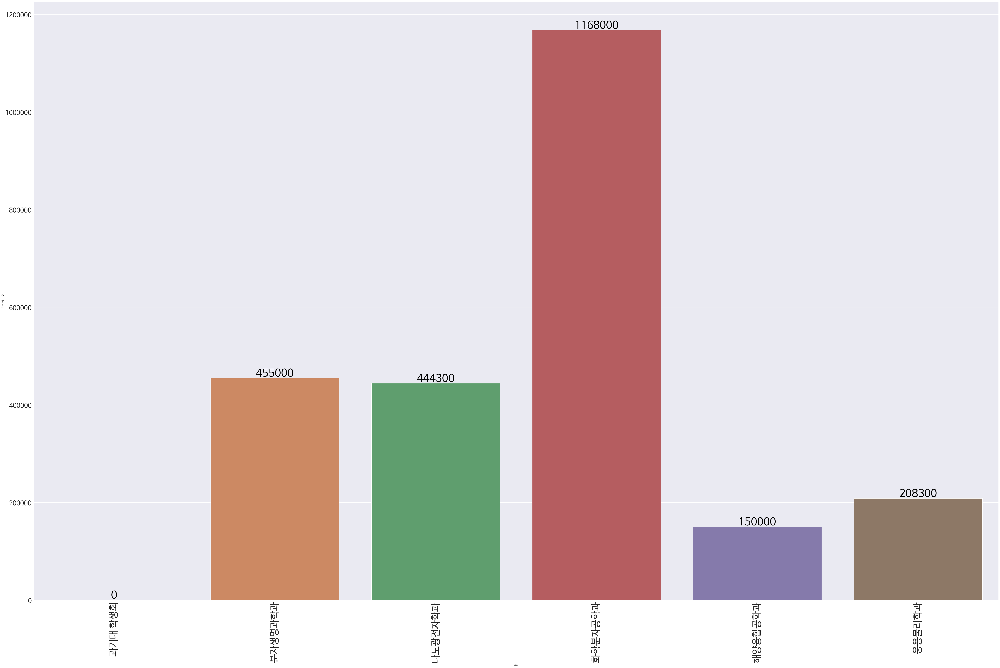

In [ ]:
g = sns.barplot(data=df_Snack_Money ,x="학과",y="야식사업지출", ci=None)
ax = g

sns.set(font="NanumBarunGothic", 
        rc={"axes.unicode_minus":False},
        style='darkgrid')
plt.rc('xtick', labelsize=30)  # x축 눈금 폰트 크기 
plt.rc('ytick', labelsize=30)
plt.rc('font', family='NanumBarunGothic') 
plt.xticks(fontsize=45, rotation=90)

rcParams['figure.figsize'] = 80, 50
current_values = plt.gca().get_yticks()
plt.gca().set_yticklabels(['{:.0f}'.format(x) for x in current_values])

for p in ax.patches: 
    ax.annotate("%.0f" % p.get_height(), (p.get_x() + p.get_width()/2., p.get_height() - 30), 
       ha='center', va='center', fontsize=50, color='black', xytext=(0, 20), 
       textcoords='offset points') 

plt.show()